In [74]:
import os
import pickle

import matplotlib.pyplot as plt
import numpy as np

from obspy.core import UTCDateTime, inventory

from scatseisnet import ScatteringNetwork

from cryoquake import data_objects as do
from cryoquake import deep_scattering as ds
from cryoquake import dayplot_backend as db

from matplotlib import dates as mdates

from sklearn.decomposition import FastICA, PCA
import umap

from matplotlib.dates import DateFormatter, DayLocator, HourLocator
import copy
import xarray as xr
import datetime
import pandas as pd

from sklearn.cluster import AgglomerativeClustering, Birch
from matplotlib import rc
import matplotlib.font_manager as fm

import fastcluster as fc
from scipy.spatial import distance
from scipy.cluster.hierarchy import dendrogram, cut_tree, to_tree, fcluster

from sknetwork.hierarchy import cut_balanced, cut_straight
from scipy.cluster import hierarchy

from scipy.stats.mstats import gmean
from matplotlib.colors import LinearSegmentedColormap

import matplotlib.colors as mcolors
from scipy.signal import hilbert

from pathlib import Path

In [75]:
root = Path.cwd()
w_path = root / "waveforms"
s_path = root / "stations"
c_path = root / "catalogues" / 'TI3A_single'
m_path = root / "misfit"
o_path = root / "outputs"
a_path = root / "arrivals"
sc_path = root / "scattering_coefficients"


In [76]:

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.sans-serif'] = 'Computer Modern'
#rc('text', usetex=True)

rc('font', size=9)
rc('xtick',labelsize=8)
rc('ytick',labelsize=8)

original_cmap = plt.get_cmap('BrBG')

# 2. Define the start and end points for the subset (0.5 to 1.0 for the upper half)
start = 0.5
end = 1.0

# 3. Sample the colors from the defined range
# original_cmap.N is the number of colors in the original map (default 256)
colors = original_cmap(np.linspace(start, end, original_cmap.N // 2))

# 4. Create a new LinearSegmentedColormap
# You can name it whatever you like (e.g., 'UpperHalfViridis')
new_cmap = LinearSegmentedColormap.from_list('UpperHalfViridis', colors)

### Continuous Seismic Data

In [77]:
inv_files = os.listdir(s_path)

inv = inventory.Inventory()

for file in inv_files:
    temp_path = os.path.join(s_path,file)
    inv += inventory.read_inventory(temp_path,level='response',format='STATIONXML')

inv = inv.select(station='TI?A',channel='CHZ')

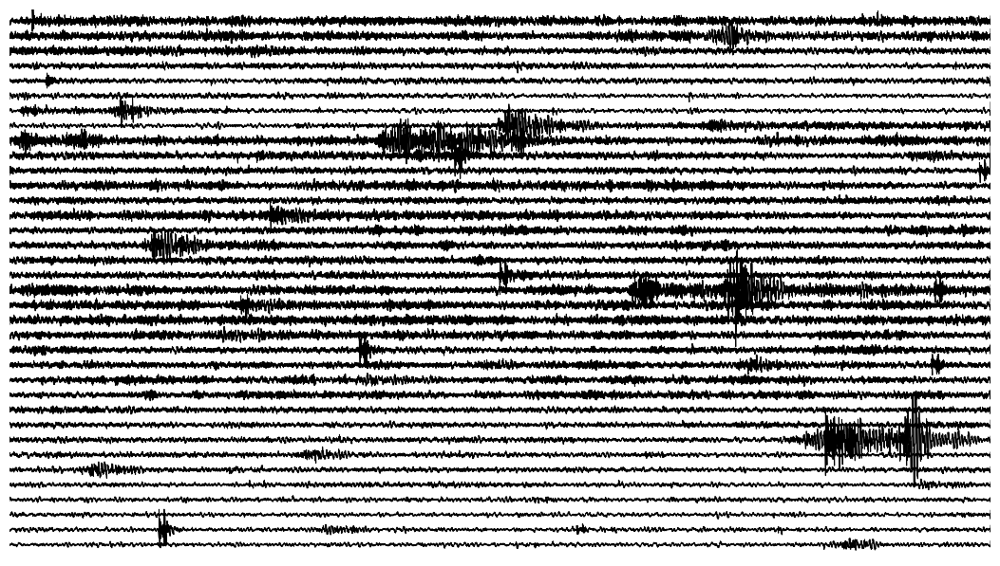

In [78]:
#make a short dayplot of Totten data, then again with events highlighted to show nature of this dataset.
t1 = UTCDateTime(2019,1,6,0)
t2 = UTCDateTime(2019,1,6,3)

chunk = do.SeismicChunk(t1,t2)

chunk.attach_waveforms(inv,w_path,buffer=60*60)
chunk.decimate(5)
#chunk.remove_response(pre_filt=[1,2,45,50],taper=False)
chunk.filter('highpass',freq=1)

dpi = 100
width = 13.33
height = 7.5
mins_per_row = 5
page_length = 6*60*60

fig = plt.figure(figsize=(width,height))
bbs_dayplot = db.StackPlot(fig,mins_per_row=mins_per_row,time_offset=0)

for daychunk in chunk(3*60*60):
    bbs_dayplot.process_chunk(daychunk)
    #bbs_dayplot.add_events(page_chunk,combined_cat)

    bbs_dayplot.normalise_traces()
    fig, ax = bbs_dayplot.make_page('1J.TI3A..CHZ',daychunk)

    plt.axis('off')
    ax.set_title("")

fig.savefig(os.path.join(o_path,'dayplot.png'),bbox_inches='tight',dpi=400)

In [79]:
sta = 4
lta = 40

thr_on = 3
thr_off = 1.5
thr_coincidence_sum = 1
avg_wave_speed = 1.5
thr_event_join = 5.0

sub_path = os.path.join(c_path)
if not os.path.exists(sub_path):
    os.mkdir(sub_path)

subarray = inv.select(station='TI3A',channel='CHZ')

#now make the broadband catalogue
chunk.attach_waveforms(subarray,w_path,buffer=60*60) #hour long buffer for filtering and STA/LTA
chunk.decimate(5)
#daychunk.remove_response(pre_filt=[1,2,20,25],taper=False)   
chunk.filter('highpass',freq=1)

chunk.context('detect')

print('Detecting events for',chunk.str_name)
chunk.detect_events(sub_path,trigger_type='classicstalta',sta=sta,lta=lta,thr_on=thr_on,thr_off=thr_off,thr_coincidence_sum=thr_coincidence_sum,avg_wave_speed=avg_wave_speed,thr_event_join=thr_event_join) 


Detecting events for 20190106T000000Z__20190106T030000Z
Detecting events for  2019-01-06  -  2019-01-07


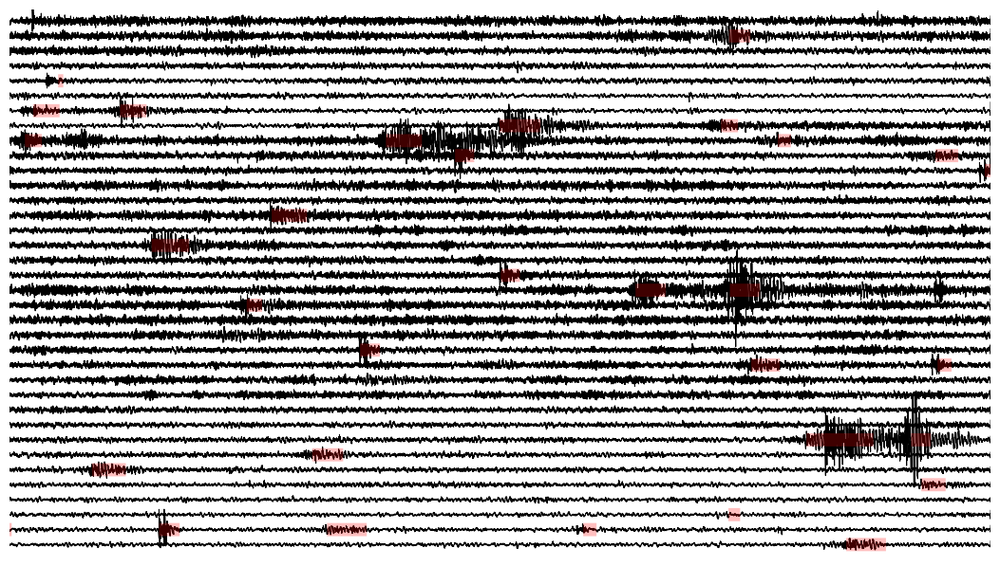

In [80]:
t1 = UTCDateTime(2019,1,6,0)
t2 = UTCDateTime(2019,1,6,3)

chunk = do.SeismicChunk(t1,t2)

bbs_cat = do.EventCatalogue(chunk.starttime,chunk.endtime,c_path)
bbs_cat.events['group'] = 2

chunk.attach_waveforms(inv,w_path,buffer=60*60)
chunk.decimate(5)
#chunk.remove_response(pre_filt=[1,2,45,50],taper=False)
chunk.filter('highpass',freq=1)

dpi = 200
width = 13.33
height = 7.5
mins_per_row = 5
page_length = 6*60*60

fig = plt.figure(figsize=(width,height))
bbs_dayplot = db.StackPlot(fig,mins_per_row=mins_per_row,time_offset=0)

for daychunk in chunk(3*60*60):
    bbs_dayplot.process_chunk(daychunk)
    bbs_dayplot.add_events(daychunk,bbs_cat)

    bbs_dayplot.normalise_traces()
    fig, ax = bbs_dayplot.make_page('1J.TI3A..CHZ',daychunk)

    plt.axis('off')
    ax.set_title("") 

fig.savefig(os.path.join(o_path,'dayplot_events.png'),bbox_inches='tight',dpi=400)

In [52]:
bbs_cat.events

,stations,network_time,ref_time,ref_duration,group
event_id,,,,,
20190106T000006Z,[1J.TI3A.],0.0,2019-01-06T00:00:06.980000Z,0.32,2
20190106T000419Z,[1J.TI3A.],0.0,2019-01-06T00:04:19.450000Z,0.20,2
20190106T000536Z,[1J.TI3A.],0.0,2019-01-06T00:05:36.680000Z,0.36,2
20190106T000615Z,[1J.TI3A.],0.0,2019-01-06T00:06:15.730000Z,4.65,2
20190106T000801Z,[1J.TI3A.],0.0,2019-01-06T00:08:01.710000Z,0.19,2
...,...,...,...,...,...
20190106T025924Z,[1J.TI3A.],0.0,2019-01-06T02:59:24.190000Z,0.19,2
20190106T025931Z,[1J.TI3A.],0.0,2019-01-06T02:59:31.940000Z,0.15,2
20190106T025937Z,[1J.TI3A.],0.0,2019-01-06T02:59:37.990000Z,0.19,2


### The Scattering Spectrum

Before worrying about the details of the clustering, it is important to set up the scattering spectra so that they are representing the important information of the windows. This means tuning the window lengths, setting the appropriate wavelets to get the relevant frequencies, and visualising a few windows to make sure that the events and noise have distinctly different spectra. The key is to make sure that transient bursts of energy are represented differently to continuous tremor, even if they are occuring at within the same frequency band. This is the power of the second order spectrum, as it can distinguish between these cases if tuned correctly.

#### Defining the Scattering Network

In [5]:
segment_duration_seconds = 30.0
sampling_rate_hertz = 100.0
samples_per_segment = int(segment_duration_seconds * sampling_rate_hertz)
bank_keyword_arguments = (
    {"octaves": 6, "resolution": 6, "quality": 6},
    {"octaves": 8, "resolution": 3, "quality": 2},
)

In [6]:
network = ScatteringNetwork(
    *bank_keyword_arguments,
    bins=samples_per_segment,
    sampling_rate=sampling_rate_hertz,
)

network.banks[0].wavelets = network.banks[0].wavelets[:-3,:]
network.banks[0].spectra = network.banks[0].spectra[:-3,:]
network.banks[0].size = network.banks[0].wavelets[:-3,:].shape[0]

network.banks[1].wavelets = network.banks[1].wavelets[6:-1,:]
network.banks[1].spectra = network.banks[1].spectra[6:-1,:]
network.banks[1].size = network.banks[1].wavelets[6:-1,:].shape[0]

print(network)

ScatteringNetwork(bins=3000, sampling_rate=100.0, len=2)
ComplexMorletBank(bins=3000, octaves=6, resolution=6, quality=6, sampling_rate=100.0, len=36)
ComplexMorletBank(bins=3000, octaves=8, resolution=3, quality=2, sampling_rate=100.0, len=24)


In [7]:
n1 = network.banks[0].size
n2 = network.banks[1].size

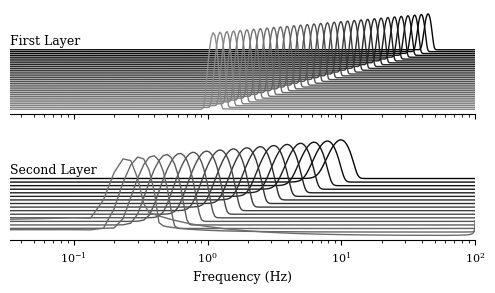

In [8]:
fig, (layer1_ax,layer2_ax) = plt.subplots(figsize=(6,3),nrows=2,sharex=True)


layer1_ax.set_xscale('log')
layer2_ax.set_xscale('log')

#layer1_ax.set_title('First Layer Wavelets',fontsize=9)
#layer2_ax.set_title('Second Layer Wavelets',fontsize=9)

layer2_ax.set_xlabel('Frequency (Hz)')
#layer1_ax.set_title('First Layer',loc='left')
#layer2_ax.set_title('Second Layer',loc='left')
layer1_ax.annotate('First Layer',(0,0.67),xycoords='axes fraction')
layer2_ax.annotate('Second Layer',(0,0.64),xycoords='axes fraction')

layer1_ax.set_xlim(1/30,1e2)

layer1_ax.set_yticks([])
layer1_ax.spines['left'].set_visible(False)
layer1_ax.spines['top'].set_visible(False)
layer1_ax.spines['right'].set_visible(False)

layer2_ax.set_yticks([])
layer2_ax.spines['left'].set_visible(False)
layer2_ax.spines['top'].set_visible(False)
layer2_ax.spines['right'].set_visible(False)

cmap = plt.colormaps.get_cmap('Greys_r')

n1 = network.banks[0].ratios.size
n2 = network.banks[1].ratios.size

i = 1
for wavelet, spectrum, ratio in zip(
        network.banks[0].wavelets, network.banks[0].spectra, network.banks[0].ratios
    ):
    layer1_ax.plot(network.banks[0].frequencies, np.log(np.abs(spectrum) + 1) + ratio, c=cmap(i/(2*n1)),lw=1)
    i += 1

i = 1
for wavelet, spectrum, ratio in zip(
        network.banks[1].wavelets, network.banks[1].spectra, network.banks[1].ratios
    ):
    layer2_ax.plot(network.banks[1].frequencies, np.log(np.abs(spectrum) + 1) + ratio, c=cmap(i/(2*n2)),lw=1)
    i += 1


fig.savefig(os.path.join(o_path,'filter_banks.pdf'),dpi=400,bbox_inches='tight')

In [ ]:
#before applying blindly to many segments, just take a ~30 s window and visualise the full scattering spectrum to get an idea of normalisation, octaves, etc.
#path = '/Users/jmagyar/Documents/TottenData'
#w_path = os.path.join(path,'waveforms')
#s_path = os.path.join(path,'stations')
#c_path = os.path.join(path,'catalogues','TI3A_single')
#sc_path = os.path.join(path,'scattering_coefficients')

t1 = UTCDateTime(2018,12,24)
t2 = UTCDateTime(2019,1,30)

chunk = do.SeismicChunk(t1,t2)
chunk.context('scattering')
chunk.load_spectra(sc_path,'second_order__dec')


tides = np.load('totten_tides.npz')
dt = tides['dt']
tide = tides['tide']

tide = tide[dt <= (t2 - t1)]
dt = dt[dt <= (t2 - t1)]

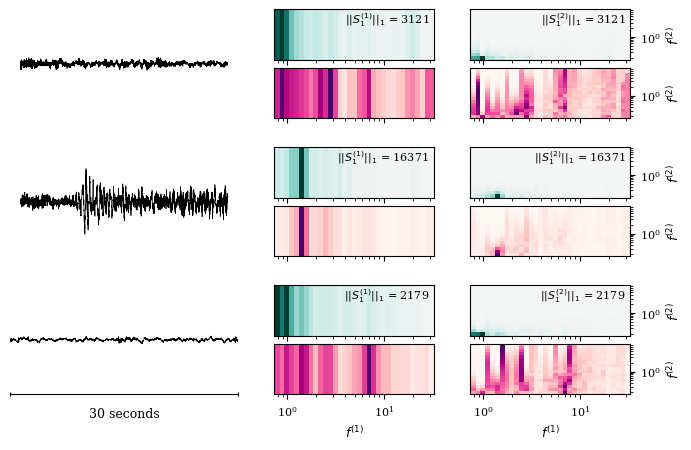

In [10]:
#fig, ax = plt.subplots(nrows=3,ncols=3,figsize=(10,4),width_ratios=[1,1,1],sharey='col',sharex='col')

fig = plt.figure(figsize=(8,5))
gs = fig.add_gridspec(ncols=3,nrows=8,width_ratios=[1,0.7,0.7],height_ratios=[1,1,0.25,1,1,0.25,1,1])

all_tr_ax = []

for l, k in enumerate([2018,1352,6667]):
    i, j = np.unravel_index(k,(chunk.N_times,chunk.N_channels))
    t = chunk.timestamps[i]
    c = chunk.channel_ids[j]

        
    starttime = UTCDateTime(pd.to_datetime(t))
    endtime = starttime + segment_duration_seconds
    seg = do.SeismicChunk(starttime,endtime)
    seg.attach_waveforms(inv,w_path,buffer=60)
    #print(seg.stream)
    seg.decimate(5)
    seg.filter('highpass',freq=1)
    stream = seg.stream.trim(starttime,endtime)
    net, sta, loc, cha = c.split('.')
    #print(cluster_name,sta,stream)
    tr = stream.select(network=net,station=sta,channel=cha)[0]

    tr_ax = fig.add_subplot(gs[2*l+l:2*(l+1)+l,0])
    tr_ax.plot(tr.times()[:-1],tr.data[:-1],lw=0.5,color='k',rasterized=True)
    
    chunk.load_spectra(sc_path,name='first_order__dec')
    chunk.load_dim_reduction(sc_path,name='first_order_p1')

    spec = (chunk.scattering_coefficients.values[i,j,:])
    norm = np.sum(spec)
    spec /= norm

    spec_2d = np.stack([spec,spec],axis=1).T

    spec_1_ax = fig.add_subplot(gs[2*l+l,1])
    spec_1_ax.pcolormesh(chunk.scattering_coefficients.f0.to_numpy(),np.array([0,1]),spec_2d,cmap=new_cmap,vmin=0) #RdPu
    spec_1_ax.set_xscale('log')
    spec_1_ax.set_yticks([])

    spec_1_ax.annotate(r'$||S_1^{(1)}||_1$ = ' + str(int(np.round(norm))),(0.97,0.73),xycoords='axes fraction',fontsize=8,ha='right')

    sdX = chunk.sdX

    spec = spec / sdX

    spec_2d = np.stack([spec,spec],axis=1).T

    spec_1_ax = fig.add_subplot(gs[2*l+1+l,1])
    spec_1_ax.pcolormesh(chunk.scattering_coefficients.f0.to_numpy(),np.array([0,1]),spec_2d,cmap='RdPu',vmin=0) #RdPu
    spec_1_ax.set_xscale('log')
    spec_1_ax.set_yticks([])

    if l != 2:
        plt.setp(spec_1_ax.get_xticklabels(), visible=False)


    chunk.load_spectra(sc_path,name='second_order__dec')
    chunk.load_dim_reduction(sc_path,name='second_order_p1')

    spec = (chunk.scattering_coefficients.values[i,j,:,:])
    norm = np.sum(spec)
    spec /= norm
    #spec_2d = np.stack([spec,spec],axis=1).T

    spec_2_ax = fig.add_subplot(gs[2*l+l,2])
    spec_2_ax.pcolormesh(chunk.scattering_coefficients.f0.to_numpy(),chunk.scattering_coefficients.f1.to_numpy(),spec.T,cmap=new_cmap,vmin=0) #RdPu
    spec_2_ax.set_xscale('log')
    spec_2_ax.set_yscale('log')
    spec_2_ax.yaxis.set_ticks_position('right')
    spec_2_ax.yaxis.set_label_position('right')
    spec_2_ax.set_ylabel(r'$f^{(2)}$')

    spec_2_ax.annotate(r'$||S_1^{(2)}||_1$ = ' + str(int(np.round(norm))),(0.97,0.73),xycoords='axes fraction',fontsize=8,ha='right')


    sdX = chunk.sdX

    spec = spec / sdX.reshape(spec.shape)

    spec_2_ax = fig.add_subplot(gs[2*l+1+l,2])
    spec_2_ax.pcolormesh(chunk.scattering_coefficients.f0.to_numpy(),chunk.scattering_coefficients.f1.to_numpy(),spec.T,cmap='RdPu',vmin=0) #RdPu
    spec_2_ax.set_xscale('log')
    spec_2_ax.set_yscale('log')
    spec_2_ax.yaxis.set_ticks_position('right')
    spec_2_ax.yaxis.set_label_position('right')
    spec_2_ax.set_ylabel(r'$f^{(2)}$')

    if l != 2:
        plt.setp(spec_2_ax.get_xticklabels(), visible=False)



    if l != 2:
        tr_ax.set_axis_off()


    else:
        tr_ax.spines['top'].set_visible(False)
        #waveform_ax.spines['bottom'].set_visible(False)
        tr_ax.spines['left'].set_visible(False)
        tr_ax.spines['right'].set_visible(False)
        tr_ax.set_xticks([0,30])
        #waveform_ax.set_yticks([])
        tr_ax.set_xticklabels(['',''])
        tr_ax.tick_params(direction='inout')
        tr_ax.set_xlabel('30 seconds')
        tr_ax.set_xlim(0,30)
        tr_ax.set_yticks([])

        spec_1_ax.set_xlabel(r'$f^{(1)}$')
        spec_2_ax.set_xlabel(r'$f^{(1)}$')

    all_tr_ax.append(tr_ax)

max_tr = 1.5 * np.max(np.array([np.max(tr_ax.get_ylim()) for tr_ax in all_tr_ax]))

for tr_ax in all_tr_ax:
    tr_ax.set_ylim(-max_tr,max_tr)

fig.savefig(os.path.join(o_path,'example_spectra.pdf'),bbox_inches='tight',dpi=400)

## Two Dimensional Illustrative Case

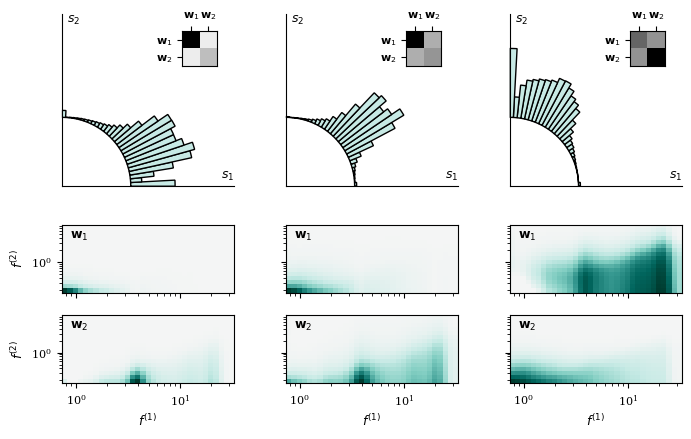

In [11]:
fig = plt.figure(figsize=(8,5))
gs = fig.add_gridspec(nrows=3,ncols=3,height_ratios=[3,1,1],wspace=0.3)

cmap = plt.colormaps.get_cmap('BrBG')
c = cmap(0.6)

for j in range(3):

    chunk.load_spectra(sc_path,name='second_order__dec')
    f1 = chunk.scattering_coefficients.f0.to_numpy()
    f2 = chunk.scattering_coefficients.f1.to_numpy()

    if j == 0:
        chunk.dim_reduction(2,p=1,log1=False)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_hellinger()
    if j == 1:
        chunk.dim_reduction(2,p=2,log1=False)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_hellinger()
    if j ==2:
        chunk.dim_reduction(2,p=1,log1=True)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_hellinger()


    #link = ds.LinkageClustering(chunk)
    # hel_S = np.sqrt(link.S_re)

    # h1 = hel_S[:,0]
    # h2 = hel_S[:,1]

    s = np.sqrt(chunk.S_re)

    angle = np.arctan2(s[:,1],s[:,0])

    ax_hist = fig.add_subplot(gs[0,j],projection='polar')
    ax_hist.set_xlim(0,np.pi/2)
    ax_hist.set_ylim(0,2.5)

    hist, bins = np.histogram(angle,bins=np.linspace(0,np.pi/2,30),density=True)
    hist /= np.max(hist)
    ax_hist.bar(bins[:-1],hist,width=np.diff(bins),bottom=1,align='edge',ec='black',fc=c)

    ax_hist.set_yticks([])
    ax_hist.set_xticks([])
    #ax_hist.vlines(np.pi/4,ymin=0,ymax=2.5,colors='black',linestyles='--')
    ax_hist.spines['polar'].set_visible(False)
    ax_hist.annotate(r'$s_1$',(0+0.02,2.5),ha='right',va='bottom')
    ax_hist.annotate(r'$s_2$',(np.pi/2-0.03,2.5),ha='left',va='top')


    G_ax = ax_hist.inset_axes([0.7,0.7,0.2,0.2])
    G_ax.set_aspect('equal')
    G_ax.invert_yaxis()
    G_ax.pcolormesh(np.arange(1,3),np.arange(1,3),chunk.G,cmap='binary',vmin=0)
    G_ax.set_xticks([1,2],labels=[r'$\mathbf{w}_1$',r'$\mathbf{w}_2$'])
    G_ax.set_yticks([1,2],labels=[r'$\mathbf{w}_1$',r'$\mathbf{w}_2$'])
    G_ax.xaxis.set_ticks_position('top')


    H = chunk.H_s

    max_basis = np.max(H)

    for i in range(2):
        basis_ax = fig.add_subplot(gs[i+1,j])
        basis = H[i,:]
        basis_2d = basis.reshape(f1.size,f2.size)
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')

        if i == 0:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            basis_ax.annotate(r'$\mathbf{w}_1$',(0.05,0.8),xycoords='axes fraction')
        else:
            basis_ax.annotate(r'$\mathbf{w}_2$',(0.05,0.8),xycoords='axes fraction')
            basis_ax.set_xlabel(r'$f^{(1)}$')

        if j != 0:
            plt.setp(basis_ax.get_yticklabels(), visible=False)
        else:
            basis_ax.set_ylabel(r'$f^{(2)}$')

fig.savefig(os.path.join(o_path,'two_dimension_reduction_norm.pdf'),bbox_inches='tight',dpi=400)

In [11]:
#chunk.compute_linkage(alpha=0.0)
nmf_dim = 2
alpha = 0.0
chunk.load_linkage(sc_path,'hellinger_nmf_' + str(nmf_dim) + '_alpha_' + str(alpha) + '_centroid_second_log1')

In [12]:
link = ds.LinkageClustering(chunk,alpha)
link.prune_cluster(4,min_size=100)
link.hellinger_centroids()

[351095 195945   9086   1662]


/var/folders/z4/gw28hj796zjdxt4nltp_h5g1m6cl00/T/ipykernel_3681/3598889854.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cube_helix = plt.cm.get_cmap('cubehelix_r')
/var/folders/z4/gw28hj796zjdxt4nltp_h5g1m6cl00/T/ipykernel_3681/3598889854.py:133: RuntimeWarning: invalid value encountered in divide
  hist /= np.sum(hist,axis=1)[:,None]


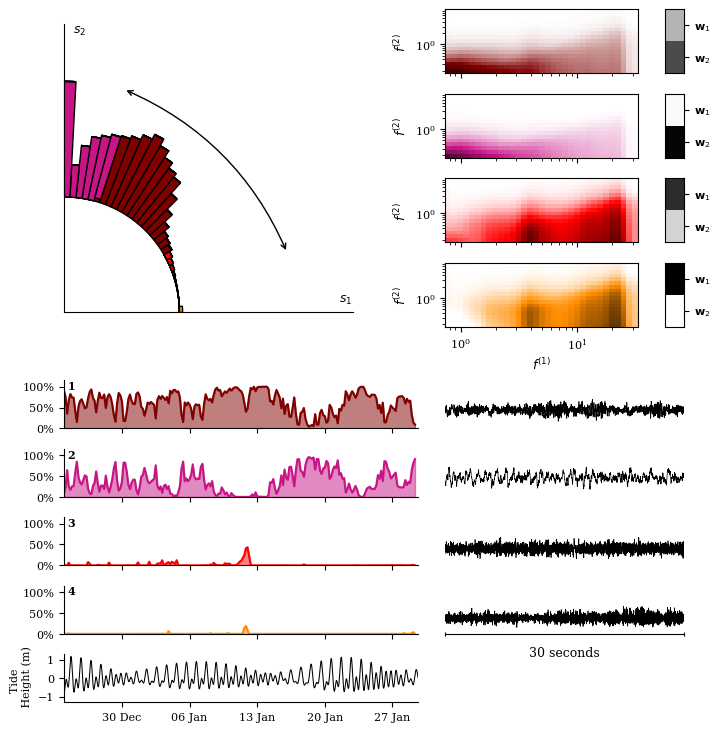

In [ ]:
c = ['maroon','mediumvioletred','red','darkorange','darkcyan','darkslateblue'] 
cube_helix = plt.cm.get_cmap('cubehelix_r')

n_bins = 30
fig = plt.figure(figsize=(8,9))

gs = fig.add_gridspec(ncols=4,nrows=10,width_ratios=(1.5,0.2,1,0.1),height_ratios=(1,1,1,1,0.2,3/4,3/4,3/4,3/4,3/4),hspace=0.4)

ax_hist = fig.add_subplot(gs[0:4,0],projection='polar')

#feature_ax.set_aspect('equal')


chunk.load_spectra(sc_path,name='second_order__dec')
f1 = chunk.scattering_coefficients.f0.to_numpy()
f2 = chunk.scattering_coefficients.f1.to_numpy()


chunk.dim_reduction(2,p=1,log1=True)
chunk.embed_hellinger()

H = chunk.H_s

centroids = (np.stack([centroid for centroid in link.centroids.values()],axis=1).T)**2 #square them to get back to proportionaility space...
centroid_specs = centroids @ H

hel_S = np.sqrt(chunk.S_re)

h1 = hel_S[:,0]
h2 = hel_S[:,1]

angle = np.arctan2(h2,h1)

ax_hist.set_xlim(0,np.pi/2)

angle_lst = []
cumulative_lst = []

cumulative = np.zeros(n_bins)

for j, name in enumerate(link.cluster_names):
    angle_j = angle[link.labels[link.ind] == name]

    hist, bins = np.histogram(angle_j,bins=np.linspace(0,np.pi/2,n_bins+1),density=False)

    angle_lst.append(hist)
    cumulative_lst.append(np.copy(cumulative))
    cumulative += hist

hist = np.stack(angle_lst,axis=1,dtype=np.float64)
cumulative = np.stack(cumulative_lst,axis=1,dtype=np.float64)

total = np.sum(hist,axis=1)

hist /= np.max(total)
cumulative /= np.max(total)

for j, name in enumerate(link.cluster_names):
    ax_hist.bar(bins[:-1],hist[:,j],width=np.diff(bins),bottom=1+cumulative[:,j],align='edge',ec='black',fc=c[j])


ax_hist.set_yticks([])
ax_hist.set_xticks([])
#ax_hist.vlines(np.pi/4,ymin=0,ymax=2.5,colors='black',linestyles='--')
ax_hist.spines['polar'].set_visible(False)
ax_hist.annotate(r'$s_1$',(0+0.02,2.5),ha='right',va='bottom')
ax_hist.annotate(r'$s_2$',(np.pi/2-0.03,2.5),ha='left',va='top')
ax_hist.set_ylim(0,2.5)


max_spec = np.max(centroid_specs)


for j, name in enumerate(link.cluster_names):

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    centroid_ax = fig.add_subplot(gs[j,2])
    scale_ax = fig.add_subplot(gs[j,3])

    centroid = centroids[j,:]
    centroid /= np.sum(centroid)
    centroid_dss = centroid_specs[j,:]

    mag = np.sum(centroid_dss)

    max_basis = np.max(centroid_dss)

    centroid_2d = centroid_dss.reshape(f1.size,f2.size)
    centroid_ax.pcolormesh(f1,f2,centroid_2d.T,cmap=custom_cm,vmin=0,vmax=max_basis*1.25) #RdPu    
    centroid_ax.set_xscale('log')
    centroid_ax.set_yscale('log')

    #centroid_ax.yaxis.set_ticks_position('right')
    #centroid_ax.yaxis.set_label_position('right')

    centroid_ax.set_ylabel(r'$f^{(2)}$')

    #centroid_ax.annotate(r'$\|S^{(2)}\|_1 = $' + str(int(np.round(mag))),(0.97,0.93),xycoords='axes fraction',va='top',ha='right',fontsize=8)

    centroid_weights = np.stack([centroid,centroid],axis=1)

    scale_ax.pcolormesh(np.array([0,1]),np.array([1,2]),centroid_weights,cmap='binary',vmin=0,vmax=1)
    scale_ax.set_xticks([])
    scale_ax.yaxis.set_ticks_position('right')
    scale_ax.set_yticks([1,2],labels=[r'$\mathbf{w}_1$',r'$\mathbf{w}_2$'])
    scale_ax.invert_yaxis()

    if j != 3:
        plt.setp(centroid_ax.get_xticklabels(), visible=False)
    else:
        centroid_ax.set_xlabel(r'$f^{(1)}$')



bin_width = 4 * 60 * 60

times_bins = np.mgrid[t1:t2:bin_width] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

all_hist = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    all_hist.append(time_hist)

hist = np.stack(all_hist,axis=1,dtype=np.float64)
hist /= np.sum(hist,axis=1)[:,None]

all_tr_ax = []

for j, name in enumerate(link.cluster_names):
    
    time_ax = fig.add_subplot(gs[j+5,0:2])
    time_ax.plot(times_bins_mt[:-1],hist[:,j],c=c[j])
    #ax[j].set_ylim(0,360)
    time_ax.fill_between(times_bins_mt[:-1],hist[:,j],color=c[j],alpha=0.5)
    time_ax.set_xlim(times_bins_mt[0],times_bins_mt[-2])
    time_ax.spines['right'].set_visible(False)
    time_ax.spines['top'].set_visible(False)
    time_ax.annotate(str(name),(0.01,1),xycoords='axes fraction',weight='bold',ha='left',va='top',fontsize=8)

    myFmt = DateFormatter("%d %b")
    time_ax.xaxis.set_major_formatter(myFmt)
    time_ax.xaxis.set_major_locator(DayLocator(interval=7))
    
    time_ax.set_ylim(0,1.15)
    time_ax.set_yticks([0,0.5,1],labels=['0%','50%','100%'])

    #if j != 4:
    plt.setp(time_ax.get_xticklabels(), visible=False)

    tr_ax = fig.add_subplot(gs[j+5,2:])

    dist_j = link.dist[name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[name][sort_ind]
    sort_id = link.group_channels[name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    #ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')

    starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
    endtime = starttime + segment_duration_seconds
    seg = do.SeismicChunk(starttime,endtime)
    seg.attach_waveforms(inv,w_path,buffer=60)
    #print(seg.stream)
    seg.decimate(5)
    seg.filter('highpass',freq=1)
    stream = seg.stream.trim(starttime,endtime)
    net, sta, loc, cha = sort_id[i].split('.')
    #print(cluster_name,sta,stream)
    tr = stream.select(network=net,station=sta,channel=cha)[0]
    tr_ax.plot(tr.times()[:-1],tr.data[:-1],lw=0.5,color='black',rasterized=True)

    if j != 3:
        tr_ax.set_axis_off()
        tr_ax.set_xlim(0,30)


    else:
        tr_ax.spines['top'].set_visible(False)
        #waveform_ax.spines['bottom'].set_visible(False)
        tr_ax.spines['left'].set_visible(False)
        tr_ax.spines['right'].set_visible(False)
        tr_ax.set_xticks([0,30])
        #waveform_ax.set_yticks([])
        tr_ax.set_xticklabels(['',''])
        tr_ax.tick_params(direction='inout')
        tr_ax.set_xlabel('30 seconds')
        tr_ax.set_xlim(0,30)
        tr_ax.set_yticks([])

    all_tr_ax.append(tr_ax)

#max_tr = 1.5 * np.max(np.array([np.max(tr_ax.get_ylim()) for tr_ax in all_tr_ax]))

for tr_ax in all_tr_ax:
    ylim = tr_ax.get_ylim()
    ymin = 1.5*ylim[0]
    ymax = 2.5*ylim[1]
    tr_ax.set_ylim(ymin,ymax)

tide_ax = fig.add_subplot(gs[-1,0:2])

tide_times = np.full(dt.size,fill_value=t1) + dt
tide_times_mt = np.array([time.matplotlib_date for time in tide_times])
tide_ax.plot(tide_times_mt,tide,lw=0.75,color='k')
tide_ax.set_ylim(-1.3,1.3)
tide_ax.set_ylabel('Tide \n Height (m)',fontsize=8)
tide_ax.set_yticks([-1,0,1])

tide_ax.spines['top'].set_visible(False)
#tide_ax.spines['bottom'].set_visible(False)
tide_ax.spines['right'].set_visible(False)

myFmt = DateFormatter("%d %b")
tide_ax.xaxis.set_major_formatter(myFmt)
tide_ax.xaxis.set_major_locator(DayLocator(interval=7))

tide_ax.set_xlim(times_bins_mt[0],times_bins_mt[-2])


start_theta = np.pi/12
end_theta = 5*np.pi/12
start_r = 2
end_r = 2

ax_hist.annotate(
    "",
    xy=(end_theta, end_r),        # Arrowhead position in data coordinates
    xytext=(start_theta, start_r), # Arrow tail position in data coordinates
    arrowprops=dict(
        arrowstyle="<->",           # Arrow style (simple arrow)
        color="black",
        connectionstyle="arc3, rad=0.2" # Curved connection (rad controls curvature)
    )
)

fig.savefig(os.path.join(o_path,'noise_sep_clustering.pdf'),bbox_inches='tight',dpi=400)

In [14]:
analytic_signal = hilbert(tide)
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.unwrap(np.angle(analytic_signal))
tidal_phase = (instantaneous_phase % (2*np.pi) - np.pi) * 180/np.pi

tidal_phase += 180
tidal_phase[tidal_phase > 180] -= 360

In [15]:
lon = 114.5
lst = (lon  / 180) * 12

lst_hr = lst // 1
lst_min = np.round((lst % 1)*60,0)

utc_noon = 12 - lst

utc_noon_hr = utc_noon // 1
utc_noon_min = np.round((utc_noon % 1)*60,0)

utc_noon_hr, utc_noon_min

(4.0, np.float64(22.0))

In [16]:
group_hists = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    timedeltas = [np.timedelta64(time,'s').astype(np.float64) for time in np.array(times) - np.datetime64(t1)]

    window_phi = np.interp(timedeltas,dt,tidal_phase)

    dphi = 10
    phi = np.mgrid[-180:181:dphi]

    hist, _ = np.histogram(window_phi,bins=phi)

    group_hists.append(hist)

all_hist = np.stack(group_hists,axis=1,dtype=np.float64)
tide_dens = all_hist / np.sum(all_hist,axis=1,keepdims=True)
tide_dens /= np.sum(tide_dens,axis=0,keepdims=True)
tide_dens /= dphi
tide_dens *= 100

tide_dens = np.concatenate([tide_dens,tide_dens[0,:][None,:]],axis=0)

In [17]:
group_hists = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]

    time_since_midnight = (times - times.astype('datetime64[D]')).astype('timedelta64[s]').astype(np.float64)
    time_since_midnight = time_since_midnight / 60 / 60

    dhrs = 0.5
    hrs = np.mgrid[0:24.01:dhrs]

    hist, _ = np.histogram(time_since_midnight,bins=hrs)

    group_hists.append(hist)

all_hist = np.stack(group_hists,axis=1,dtype=np.float64)
time_dens = all_hist / np.sum(all_hist,axis=1,keepdims=True)
time_dens /= np.sum(time_dens,axis=0,keepdims=True)
time_dens /= dhrs
time_dens *= 100

time_dens = np.concatenate([time_dens,time_dens[0,:][None,:]],axis=0)

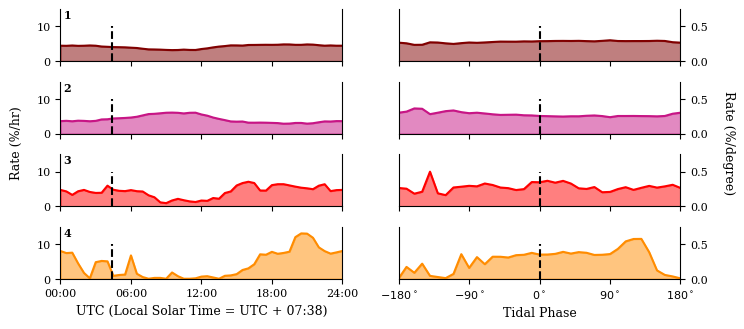

In [ ]:
fig, ax = plt.subplots(ncols=2,nrows=4,figsize=(8,3.5),sharey='col',sharex='col',gridspec_kw={'hspace':0.4})

for j, name in enumerate(link.cluster_names):
    time_ax = ax[j,0]
    tide_ax = ax[j,1]
    
    time_ax.plot(hrs,time_dens[:,j],color=c[j])
    time_ax.set_ylim(bottom=0,top=15)

    time_ax.fill_between(hrs,time_dens[:,j],color=c[j],alpha=0.5)
    time_ax.set_xlim(0,24)
    #time_ax.spines['right'].set_visible(False)
    time_ax.spines['top'].set_visible(False)

    time_ax.vlines(utc_noon,ymin=0,ymax=10,colors='black',ls='--')

    time_ax.set_xticks([0,6,12,18,24],labels=['00:00','06:00','12:00','18:00','24:00'])

    time_ax.annotate(str(name),(0.01,1),xycoords='axes fraction',weight='bold',ha='left',va='top',fontsize=8)


    tide_ax.plot(phi,tide_dens[:,j],color=c[j])
    tide_ax.fill_between(phi,tide_dens[:,j],color=c[j],alpha=0.5)
    #tide_ax.bar(phi[:-1],height=tide_dens[:,j],width=np.diff(phi),fc=c[j])
    tide_ax.set_xlim(-180,180)
    #tide_ax.spines['left'].set_visible(False)
    tide_ax.spines['top'].set_visible(False)
    tide_ax.yaxis.set_ticks_position('right')

    tide_ax.set_xticks([-180,-90,0,90,180],labels=[r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])
    tide_ax.set_ylim(bottom=0,top=0.75)

    tide_ax.vlines(0,ymin=0,ymax=0.5,colors='black',ls='--')


ax[-1,0].set_xlabel('UTC (Local Solar Time = UTC + 07:38)')
ax[-1,1].set_xlabel('Tidal Phase')

fig.text(0.07, 0.5, 'Rate (%/hr)', ha='center', va='center', rotation=90)
fig.text(0.96, 0.5, 'Rate (%/degree)', ha='center', va='center', rotation=-90)

fig.savefig(os.path.join(o_path,'noise_wrapping.pdf'),bbox_inches='tight',dpi=400)

### Event Representation for Two Basis Functions

In [19]:
#chunk.compute_linkage(alpha=0.0)
nmf_dim = 2
alpha = 0.5
chunk.load_linkage(sc_path,'hellinger_nmf_' + str(nmf_dim) + '_alpha_' + str(alpha) + '_centroid_second_log1')

In [20]:
link = ds.LinkageClustering(chunk,alpha)
link.prune_cluster(15,min_size=100)
link.hellinger_centroids()

[291183 136253 114910  13159   2118    112     21     12      6      5
      3      3      1      1      1]
[291183 136253 114910  13159   1492    626    112     21     12      6
      5      3      3      1      1      1]
[291183 136253 114910  13159   1492    626    112     21     12      6
      5      3      2      1      1      1      1]
[291183 136253 114910  13159   1492    617    112     21     12      9
      6      5      3      2      1      1      1      1]
[291183 136253 114910  13159   1492    617    112     21     12      9
      6      4      3      2      1      1      1      1      1]
[291183 136253 114910  13044   1492    617    115    112     21     12
      9      6      4      3      2      1      1      1      1      1]
[291177 136253 114910  13044   1492    617    115    112     21     12
      9      6      6      4      3      2      1      1      1      1
      1]
[291177 136253 114910  12913   1492    617    131    115    112     21
     12      9      6    

In [21]:
#try to make a standard scale for above plot...
times_bins = np.mgrid[t1:t2:1*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

all_hist = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)

    all_hist.append(time_hist)

hist = np.stack(all_hist,axis=1,dtype=np.float64)
hist /= np.sum(hist,axis=1,keepdims=True)

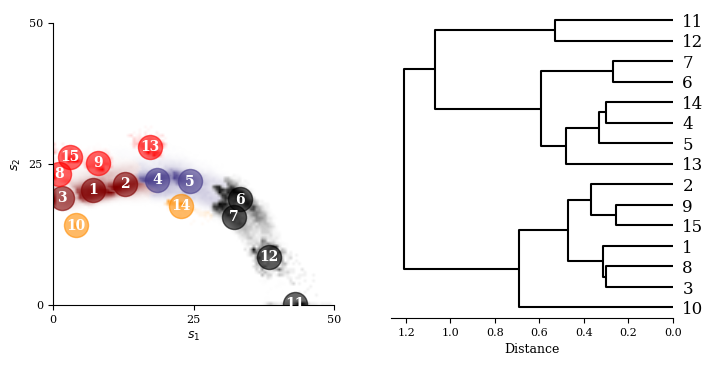

In [ ]:
#try doing colouring based on the types of signals in each...

from matplotlib.colors import to_rgba

#c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4
c = ['maroon','darkslateblue','red','darkorange','black'] * 4

c_class = [c[0],c[0],c[0],c[1],c[1],c[4],c[4],c[2],c[2],c[3],c[4],c[4],c[2],c[3],c[2]]

K = 5

X = np.sqrt(chunk.S_re[:,0]) * chunk.X_len**(alpha)
Y = np.sqrt(chunk.S_re[:,1]) * chunk.X_len**(alpha)

# Define common grid
xbins = np.linspace(0, 50, 100)
ybins = np.linspace(0, 50, 100)

fig = plt.figure(figsize=(8,4))

gs = fig.add_gridspec(ncols=2)

feature_ax = fig.add_subplot(gs[0])
feature_ax.set_aspect('equal')

colors = plt.cm.tab10(np.linspace(0, 1, K))

for j, cluster_name in enumerate(link.cluster_names):
    color = to_rgba(c_class[j])

    mask = (link.labels[link.ind] == cluster_name)
    H, xedges, yedges = np.histogram2d(
        X[mask], Y[mask],
        bins=[xbins, ybins]
    )

    H = H.T  # imshow expects (y, x)

    # Normalize (optional)
    H = H / H.max() if H.max() > 0 else H

    # Alpha: zero density → transparent
    alph = np.clip(H, 0, 1)

    # Create RGBA image
    rgba = np.zeros((*H.shape, 4))
    rgba[..., :3] = color[:3]   # RGB
    rgba[..., 3] = alph        # alpha channel

    feature_ax.imshow(
        rgba,
        origin='lower',
        extent=[xbins.min(), xbins.max(), ybins.min(), ybins.max()],
        interpolation='bilinear'
    )

    centre = link.centroids[cluster_name]

    feature_ax.scatter(centre[0],centre[1],c=c_class[j],s=300,alpha=0.6)
    feature_ax.annotate(cluster_name,centre,ha='center',va='center',weight='bold',color='white',fontsize=10)

feature_ax.spines['top'].set_visible(False)
feature_ax.spines['right'].set_visible(False)
feature_ax.set_xlabel(r'$s_1$')
feature_ax.set_ylabel(r'$s_2$')
feature_ax.set_xticks([0,25,50])
feature_ax.set_yticks([0,25,50])


P = np.stack([centre for centre in link.centroids_emb.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)

linkage = hierarchy.linkage(pdist, method="centroid",metric='euclidean',optimal_ordering=True)

dend_ax = fig.add_subplot(gs[1])

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=False,above_threshold_color='black')

dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)
dend_ax.spines['top'].set_visible(False)
dend_ax.set_xlabel('Distance')

fig.savefig(os.path.join(o_path,'centroid_linkage_2d.pdf'),bbox_inches='tight',dpi=400)

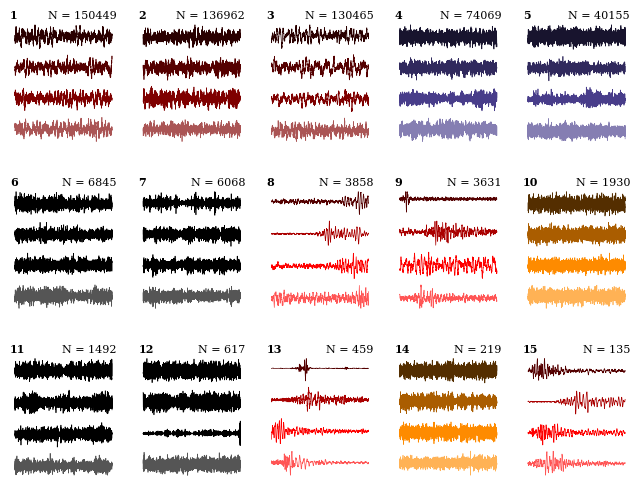

In [ ]:
fig, axes = plt.subplots(nrows=3,ncols=5,figsize=(8,6),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c_class[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(1,1),xycoords='axes fraction',fontsize=8,ha='right')
    ax.annotate(cluster_name,(0,1),xycoords='axes fraction',fontsize=8,ha='left',weight='bold')

    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

fig.savefig(os.path.join(o_path,'clustering_waveforms_2d.pdf'),bbox_inches='tight',dpi=400)

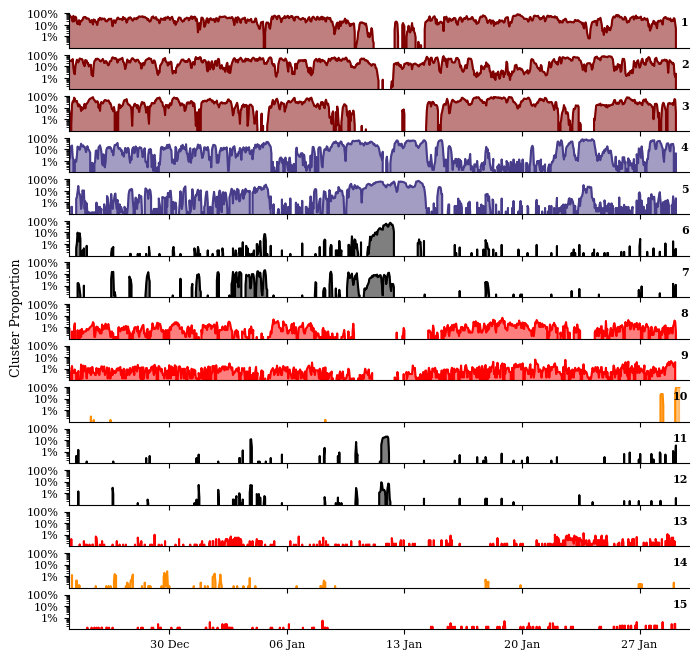

In [ ]:
fig, ax = plt.subplots(nrows=15,sharex=True,sharey=True,figsize=(8,8))

norm_hist = 100 * hist# / np.nansum(hist,axis=0,keepdims=True) #make each cluster sum to 100%

for j, name in enumerate(link.cluster_names):
    ax[j].plot(times_bins_mt[:-1],norm_hist[:,j],c=c_class[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],norm_hist[:,j],color=c_class[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top',fontsize=8)

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))
    ax[j].set_yscale('log')
    ax[j].set_ylim(0.1,100)
    ax[j].set_yticks([1,10,100],labels=['1%','10%','100%'])

fig.text(0.06, 0.5, 'Cluster Proportion', ha='center', va='center', rotation=90)


fig.savefig(os.path.join(o_path,'log_cluster_distribution_2d.pdf'),bbox_inches='tight',dpi=400)

### Higher Dimensional NMF

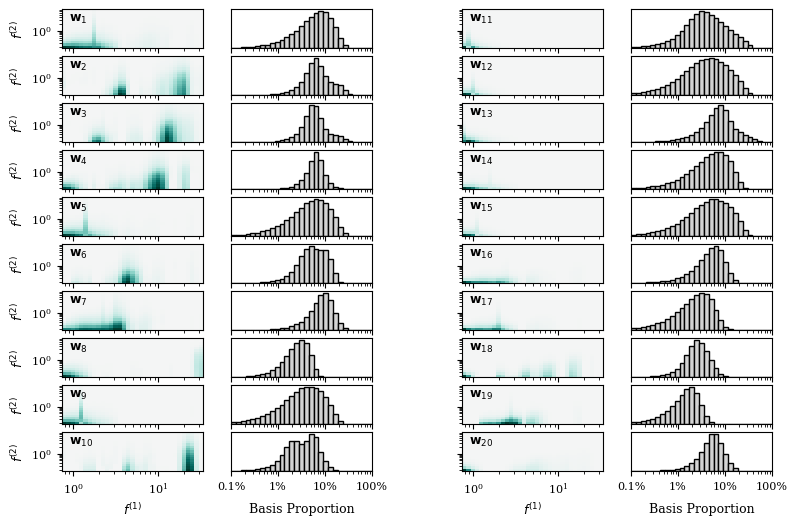

In [ ]:
#plot the dimension reduction...

nmf_dim = 20

chunk.load_spectra(sc_path,'second_order__dec')
f1 = chunk.scattering_coefficients.f0.to_numpy()
f2 = chunk.scattering_coefficients.f1.to_numpy()
chunk.dim_reduction(nmf_dim,p=2,log1=False)


#when using log scaling, all cases of p become the same, so can instead do first and second order in one plot...
master_fig = plt.figure(figsize=(8,6))

fig_gs = master_fig.add_gridspec(ncols=2)

fig1 = master_fig.add_subfigure(fig_gs[0])
fig2 = master_fig.add_subfigure(fig_gs[1])

j = 0
for fig in [fig1,fig2]:


    ax_gs = fig.add_gridspec(nrows=10,ncols=2)
    
    H = chunk.H

    H *= chunk.sdX[None,:]

    #H_norm = np.linalg.norm(H,axis=1)
    H_sum = np.sum(H,axis=1)

    #H = H / H_norm[:,None]
    H /= H_sum[:,None]

    S = chunk.S
    #S = S * H_norm[None,:]
    S *= H_sum[None,:]

    S_norm = np.sum(S,axis=1,keepdims=True)

    S /= S_norm

    #sens_ax = fig.add_subplot(ax_gs[0,0])

    #sens = 1 / chunk.sdX
    #sens_2d = sens.reshape(f1.size,f2.size)
    #sens_ax.pcolormesh(f1,f2,np.log10(sens_2d.T),cmap='BuPu') #RdPu
    #sens_ax.set_xscale('log')
    #sens_ax.set_yscale('log')

    max_basis = np.max(H)


    for i in range(10):

        basis_ax = fig.add_subplot(ax_gs[i,0])

        basis = H[i+10*j,:]
        #max_basis = np.max(np.absolute(basis))
        basis_2d = basis.reshape(f1.size,f2.size)
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')

        S_bins = np.logspace(-3,0,30)
        hist, bins = np.histogram(S[:,i+10*j],bins=S_bins,density=False)

        hist_ax = fig.add_subplot(ax_gs[i,1])
        hist_ax.bar(S_bins[:-1],height=hist,width=np.diff(S_bins),align='edge',facecolor='lightgrey',edgecolor='black')
        hist_ax.set_xscale('log')
        hist_ax.set_yticks([])
        hist_ax.set_xticks([1e-3,1e-2,1e-1,1e0],labels=['0.1%','1%','10%','100%'])
        hist_ax.set_xlim(S_bins[0],S_bins[-1])

        if i != 9:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            plt.setp(hist_ax.get_xticklabels(), visible=False)

        if j != 0:
            plt.setp(basis_ax.get_yticklabels(), visible=False)

        if j == 0:
            basis_ax.set_ylabel(r'$f^{(2)}$')

        
        basis_ax.annotate(fr'$\mathbf{{w}}_{{{1+i+10*j}}}$',(0.05,0.7),xycoords='axes fraction')



    basis_ax.set_xlabel(r'$f^{(1)}$')
    hist_ax.set_xlabel('Basis Proportion',labelpad=8)
    
    j += 1

master_fig.savefig(os.path.join(o_path,'nmf_20_p2_basis_functions.pdf'),dpi=400,bbox_inches='tight')

In [40]:
alpha = 0.5
chunk.load_linkage(sc_path,'hellinger_nmf_' + str(nmf_dim) + '_alpha_' + str(alpha) + '_centroid_second_p2')
chunk.embed_hellinger()

In [41]:
link = ds.LinkageClustering(chunk,alpha)
link.prune_cluster(30,min_size=20)
link.hellinger_centroids()

[557555    178     26      2      2      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1]
[557555    178     26      2      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1]
[557555    127     49     26      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1]
[557555    176     26      2      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1]
[557555    127     49     26      2      1      1      1      1      1
      1

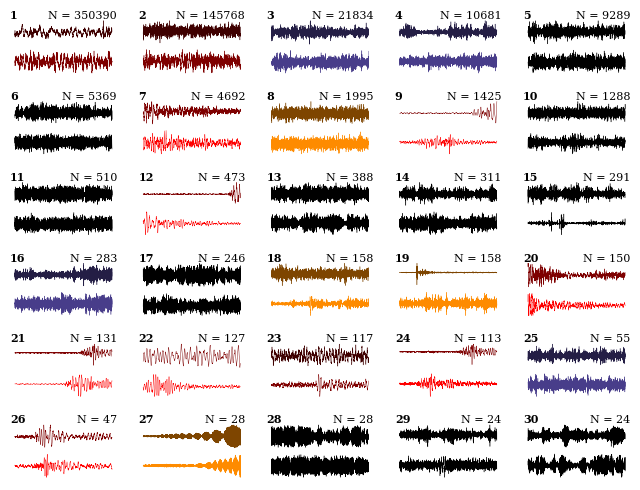

In [53]:
#need to choose colours to get plot right...

#c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4

c = ['maroon','darkslateblue','red','darkorange','black','forestgreen'] * 4

#0 = low frequency noise
#1 = high frequency noise
#2 = stick-slip event
#3 = other noise
#4 = storm
#5 = other events...

c_class = [c[0],c[0],c[1],c[1],c[4],
           c[4],c[2],c[3],c[2],c[4],
           c[4],c[2],c[4],c[4],c[4],
           c[1],c[4],c[3],c[3],c[2],
           c[2],c[2],c[0],c[2],c[1],
           c[2],c[3],c[4],c[4],c[4]]

fig, axes = plt.subplots(nrows=6,ncols=5,figsize=(8,6),gridspec_kw={'hspace':0.4})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c_class[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(1,1),xycoords='axes fraction',fontsize=8,ha='right')
    ax.annotate(cluster_name,(0,1),xycoords='axes fraction',fontsize=8,ha='left',weight='bold')

    for i in range(2):
        frac = (i+2) / (4)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.3,color=custom_cm(frac),rasterized=True)
            #ax.set_ylim(-2,2)
        except IndexError:
            print('Skipping plot')

        i += 1

fig.savefig('coloured_highD_clusters.pdf',dpi=400,bbox_inches='tight')

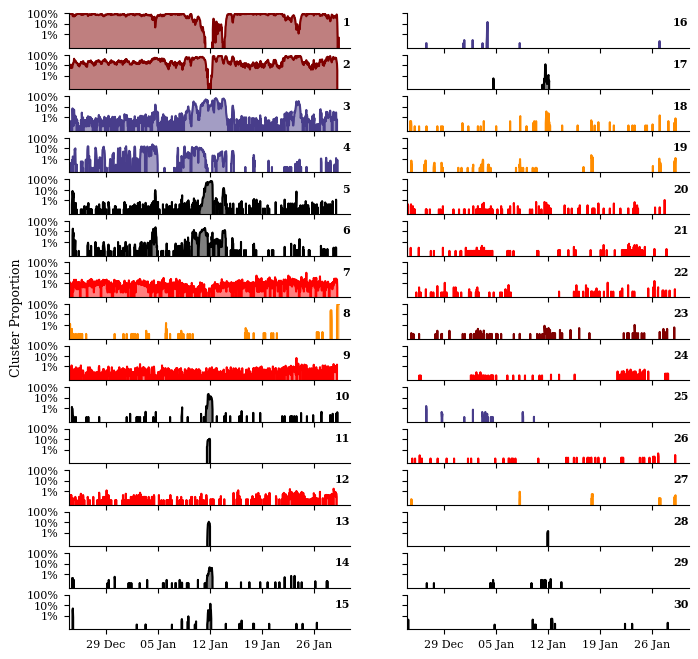

In [54]:
fig, ax = plt.subplots(nrows=15,ncols=2,sharex=True,sharey=True,figsize=(8,8))

#try to make a standard scale for above plot...
times_bins = np.mgrid[t1:t2:1*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

all_hist = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)

    all_hist.append(time_hist)

hist = np.stack(all_hist,axis=1,dtype=np.float64)
hist /= np.sum(hist,axis=1,keepdims=True)

norm_hist = 100 * hist# / np.nansum(hist,axis=0,keepdims=True) #make each cluster sum to 100%

ax = ax.flatten('F')

for j, name in enumerate(link.cluster_names):
    ax[j].plot(times_bins_mt[:-1],norm_hist[:,j],c=c_class[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],norm_hist[:,j],color=c_class[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2]+1)
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top',fontsize=8)

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))
    ax[j].set_yscale('log')
    ax[j].set_ylim(0.05,100)
    ax[j].set_yticks([1,10,100],labels=['1%','10%','100%'])

fig.text(0.06, 0.5, 'Cluster Proportion', ha='center', va='center', rotation=90)

fig.savefig('temporal_highD.pdf',bbox_inches='tight',dpi=400)

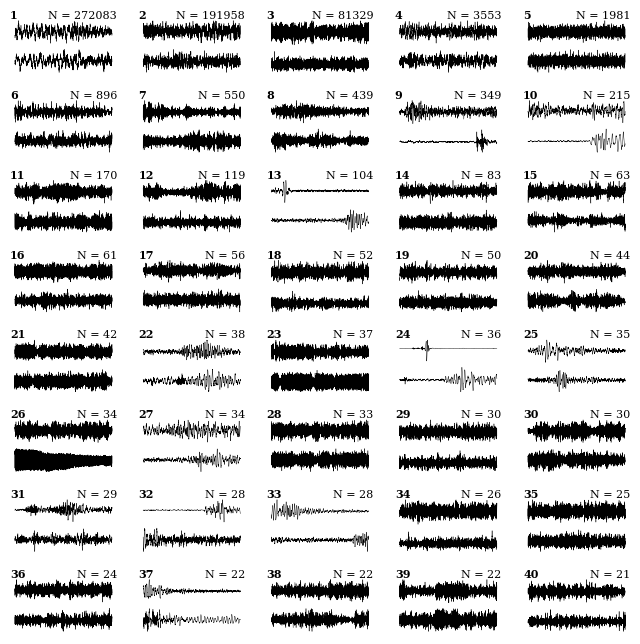

In [91]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4

fig, axes = plt.subplots(nrows=8,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.4})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(1,1),xycoords='axes fraction',fontsize=8,ha='right')
    ax.annotate(cluster_name,(0,1),xycoords='axes fraction',fontsize=8,ha='left',weight='bold')

    for i in range(2):
        frac = (i+2) / (4)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.3,color='black',rasterized=True)
            #ax.set_ylim(-2,2)
        except IndexError:
            print('Skipping plot')

        i += 1

fig.savefig('centroid_waveforms_highD_alpha_on.pdf',bbox_inches='tight',dpi=400)

In [92]:
nmf_dim = 20
alpha = 1.0
chunk.load_linkage(sc_path,'hellinger_nmf_' + str(nmf_dim) + '_alpha_' + str(alpha) + '_centroid_second_log1')
link = ds.LinkageClustering(chunk,alpha)
link.prune_cluster(40,min_size=20)
link.hellinger_centroids()

[557463    261      4      4      3      3      3      3      2      2
      2      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1]
[557463    263      7      6      4      3      3      2      2      2
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1]
[557463    261      4      4      3      3      3      3      2      2
      2      2      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1]
[5

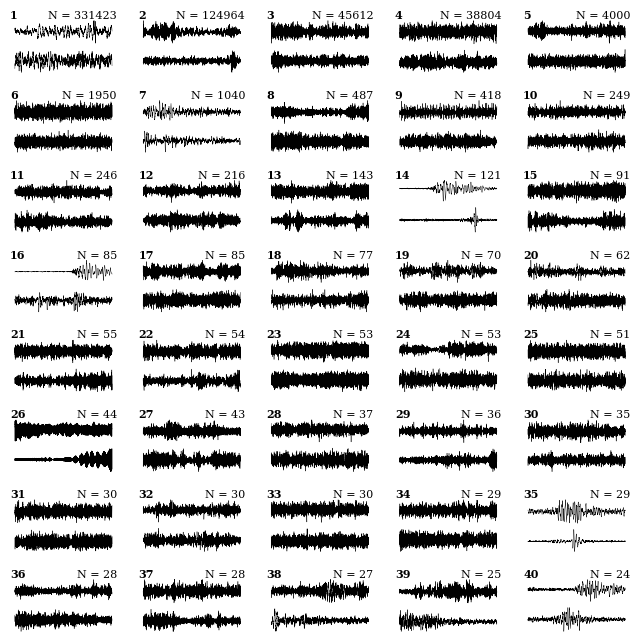

In [93]:
fig, axes = plt.subplots(nrows=8,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.4})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(1,1),xycoords='axes fraction',fontsize=8,ha='right')
    ax.annotate(cluster_name,(0,1),xycoords='axes fraction',fontsize=8,ha='left',weight='bold')

    for i in range(2):
        frac = (i+2) / (4)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.3,color='black',rasterized=True)
            #ax.set_ylim(-2,2)
        except IndexError:
            print('Skipping plot')

        i += 1

fig.savefig('centroid_waveforms_highD_alpha_strong.pdf',bbox_inches='tight',dpi=400)

In [94]:
nmf_dim = 20
alpha = 0.0
chunk.load_linkage(sc_path,'hellinger_nmf_' + str(nmf_dim) + '_alpha_' + str(alpha) + '_centroid_second_log1')
link = ds.LinkageClustering(chunk,alpha)
link.prune_cluster(40,min_size=20)
link.hellinger_centroids()

[557402    122     83     32     14      8      8      6      5      5
      5      4      4      4      3      3      3      3      2      2
      2      2      2      2      2      2      2      2      2      2
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1]
[555303    992    955    126     94     78     22     16      8      8
      6      5      5      5      4      4      4      4      3      3
      3      3      3      3      3      2      2      2      2      2
      2      2      2      2      2      2      2      2      2      2
      2      1      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
     

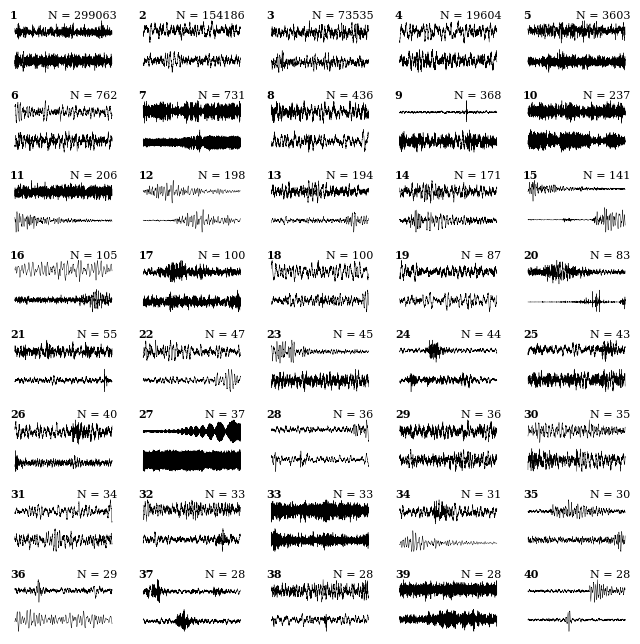

In [95]:
fig, axes = plt.subplots(nrows=8,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.4})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(1,1),xycoords='axes fraction',fontsize=8,ha='right')
    ax.annotate(cluster_name,(0,1),xycoords='axes fraction',fontsize=8,ha='left',weight='bold')

    for i in range(2):
        frac = (i+2) / (4)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.3,color='black',rasterized=True)
            #ax.set_ylim(-2,2)
        except IndexError:
            print('Skipping plot')

        i += 1

fig.savefig('centroid_waveforms_highD_alpha_off.pdf',bbox_inches='tight',dpi=400)

Text(0.5, 0, 'Distance')

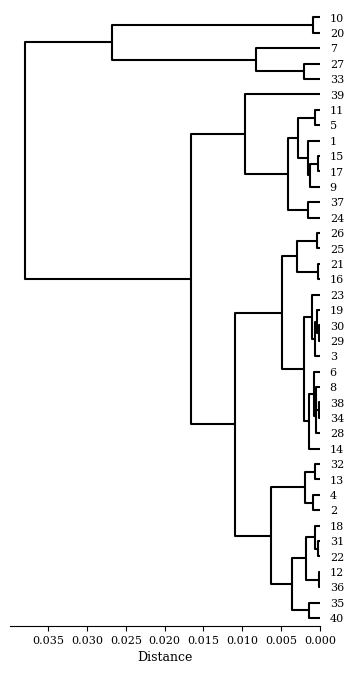

In [96]:
fig = plt.figure(figsize=(4,8)) #eventually add the centroid waveform to each - could this avoid even having the need to include the above plot if only showing the centroid?


P = np.stack([centre for centre in link.centroids_emb.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)

linkage = hierarchy.linkage(pdist, method="centroid",metric='euclidean',optimal_ordering=True)

dend_ax = fig.add_subplot(111)

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=False,above_threshold_color='black')

dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)
dend_ax.spines['top'].set_visible(False)
dend_ax.set_xlabel('Distance')

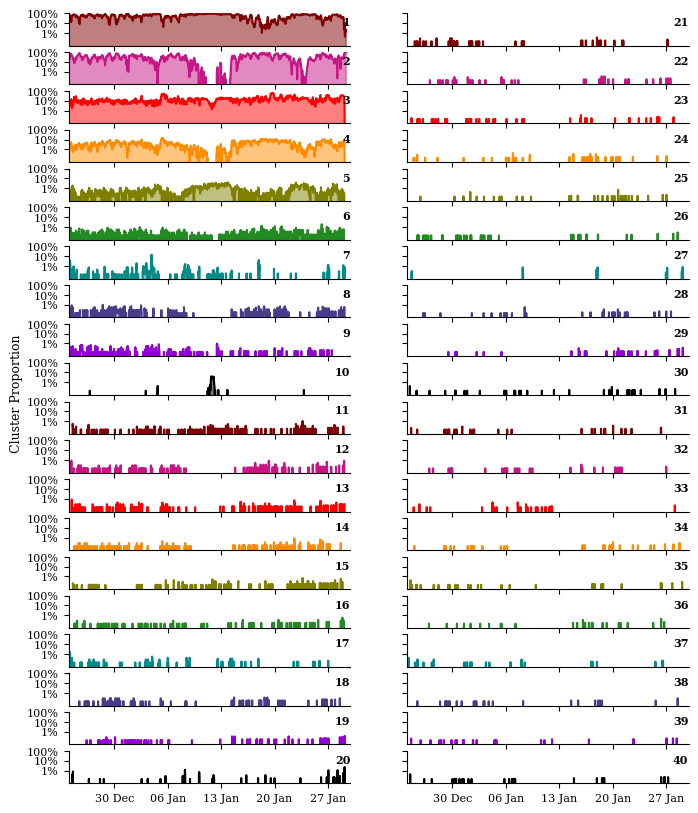

In [97]:
fig, ax = plt.subplots(nrows=20,ncols=2,sharex=True,sharey=True,figsize=(8,10))

#try to make a standard scale for above plot...
times_bins = np.mgrid[t1:t2:1*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

all_hist = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)

    all_hist.append(time_hist)

hist = np.stack(all_hist,axis=1,dtype=np.float64)
hist /= np.sum(hist,axis=1,keepdims=True)

norm_hist = 100 * hist# / np.nansum(hist,axis=0,keepdims=True) #make each cluster sum to 100%

ax = ax.flatten('F')

for j, name in enumerate(link.cluster_names):
    ax[j].plot(times_bins_mt[:-1],norm_hist[:,j],c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],norm_hist[:,j],color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top',fontsize=8)

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))
    ax[j].set_yscale('log')
    ax[j].set_ylim(0.05,100)
    ax[j].set_yticks([1,10,100],labels=['1%','10%','100%'])

fig.text(0.06, 0.5, 'Cluster Proportion', ha='center', va='center', rotation=90)

fig.savefig('cluster_evolution_highD.pdf',bbox_inches='tight',dpi=400)

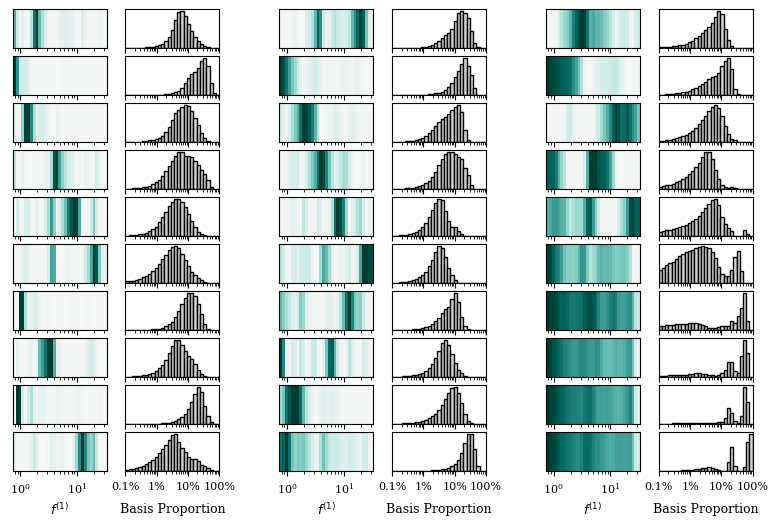

In [151]:
#when using log scaling, all cases of p become the same, so can instead do first and second order in one plot...
master_fig = plt.figure(figsize=(8,6))

fig_gs = master_fig.add_gridspec(ncols=3)

norm_fig = master_fig.add_subfigure(fig_gs[0])
sqrt_fig = master_fig.add_subfigure(fig_gs[1])
log_fig = master_fig.add_subfigure(fig_gs[2])

j = 0
for fig in [norm_fig, sqrt_fig, log_fig]:

    chunk.load_spectra(sc_path,name='first_order__dec')
    f1 = chunk.scattering_coefficients.f0.to_numpy()

    ax_gs = fig.add_gridspec(nrows=10,ncols=2)

    if j == 0:
        chunk.load_dim_reduction(sc_path,'first_order_p1')
    if j == 1:
        chunk.load_dim_reduction(sc_path,'first_order_p2')
    if j == 2:
        chunk.load_dim_reduction(sc_path,'first_order_log1')

    
    H = chunk.H

    H *= chunk.sdX[None,:]

    #H_norm = np.linalg.norm(H,axis=1)
    H_sum = np.sum(H,axis=1)

    #H = H / H_norm[:,None]
    H /= H_sum[:,None]

    S = chunk.S
    #S = S * H_norm[None,:]
    S *= H_sum[None,:]

    S_norm = np.sum(S,axis=1,keepdims=True)

    S /= S_norm
        
    # H = chunk.H

    # H *= chunk.sdX[None,:]

    # H_norm = np.linalg.norm(H,ord=1,axis=1)
    # H = H / H_norm[:,None]

    # S = chunk.S
    # S = S * H_norm[None,:]

    # S_norm = S / np.sum(S,axis=1)[:,None]


    #sens_ax = fig.add_subplot(ax_gs[0,0])

    #sens = 1 / chunk.sdX**2
    #sens_2d = np.stack([sens,sens],axis=1).T
    #sens_ax.pcolormesh(f1,np.array([0,1]),np.log10(sens_2d),cmap='BuPu') #RdPu
    #sens_ax.set_xscale('log')
    #sens_ax.set_yticks([])

    max_basis = np.max(H)

    for i in range(10):

        basis_ax = fig.add_subplot(ax_gs[i,0])

        basis = H[i,:]
        #max_basis = np.max(np.absolute(basis))
        basis_2d = np.stack([basis,basis],axis=1).T
        basis_ax.pcolormesh(f1,np.array([0,1]),basis_2d,cmap=new_cmap,vmin=0) #RdPu
        basis_ax.set_xscale('log')
        basis_ax.set_yticks([])

        S_bins = np.logspace(-3,0,30)
        hist, bins = np.histogram(S[:,i],bins=S_bins,density=False)

        hist_ax = fig.add_subplot(ax_gs[i,1])
        hist_ax.bar(S_bins[:-1],height=hist,width=np.diff(S_bins),align='edge',facecolor='lightgrey',edgecolor='black')
        hist_ax.set_xscale('log')
        hist_ax.set_yticks([])
        hist_ax.set_xticks([1e-3,1e-2,1e-1,1e0],labels=['0.1%','1%','10%','100%'],fontsize=8)
        hist_ax.set_xlim(S_bins[0],S_bins[-1])

        if i != 9:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            plt.setp(hist_ax.get_xticklabels(), visible=False)


    basis_ax.set_xlabel(r'$f^{(1)}$')
    hist_ax.set_xlabel('Basis Proportion',labelpad=8)

    
    j += 1

master_fig.savefig('first_order_nmf.pdf',bbox_inches='tight',dpi=400)

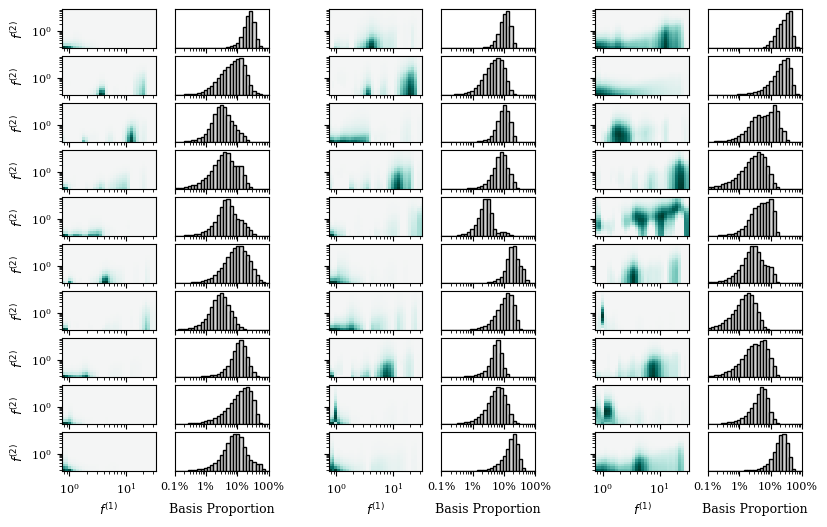

In [11]:
#when using log scaling, all cases of p become the same, so can instead do first and second order in one plot...
master_fig = plt.figure(figsize=(8,6))

fig_gs = master_fig.add_gridspec(ncols=3)

norm_fig = master_fig.add_subfigure(fig_gs[0])
sqrt_fig = master_fig.add_subfigure(fig_gs[1])
log_fig = master_fig.add_subfigure(fig_gs[2])

j = 0
for fig in [norm_fig, sqrt_fig, log_fig]:

    chunk.load_spectra(sc_path,name='second_order__dec')
    f1 = chunk.scattering_coefficients.f0.to_numpy()
    f2 = chunk.scattering_coefficients.f1.to_numpy()


    ax_gs = fig.add_gridspec(nrows=10,ncols=2)

    if j == 0:
        chunk.load_dim_reduction(sc_path,'second_order_p1')
    if j == 1:
        chunk.load_dim_reduction(sc_path,'second_order_p2')
    if j == 2:
        chunk.load_dim_reduction(sc_path,'second_order_log1')
    
    
    H = chunk.H

    H *= chunk.sdX[None,:]

    #H_norm = np.linalg.norm(H,axis=1)
    H_sum = np.sum(H,axis=1)

    #H = H / H_norm[:,None]
    H /= H_sum[:,None]

    S = chunk.S
    #S = S * H_norm[None,:]
    S *= H_sum[None,:]

    S_norm = np.sum(S,axis=1,keepdims=True)

    S /= S_norm

    #sens_ax = fig.add_subplot(ax_gs[0,0])

    #sens = 1 / chunk.sdX
    #sens_2d = sens.reshape(f1.size,f2.size)
    #sens_ax.pcolormesh(f1,f2,np.log10(sens_2d.T),cmap='BuPu') #RdPu
    #sens_ax.set_xscale('log')
    #sens_ax.set_yscale('log')

    max_basis = np.max(H)


    for i in range(10):

        basis_ax = fig.add_subplot(ax_gs[i,0])

        basis = H[i,:]
        #max_basis = np.max(np.absolute(basis))
        basis_2d = basis.reshape(f1.size,f2.size)
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')

        S_bins = np.logspace(-3,0,30)
        hist, bins = np.histogram(S[:,i],bins=S_bins,density=False)

        hist_ax = fig.add_subplot(ax_gs[i,1])
        hist_ax.bar(S_bins[:-1],height=hist,width=np.diff(S_bins),align='edge',facecolor='lightgrey',edgecolor='black')
        hist_ax.set_xscale('log')
        hist_ax.set_yticks([])
        hist_ax.set_xticks([1e-3,1e-2,1e-1,1e0],labels=['0.1%','1%','10%','100%'])
        hist_ax.set_xlim(S_bins[0],S_bins[-1])

        if i != 9:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            plt.setp(hist_ax.get_xticklabels(), visible=False)

        if j != 0:
            plt.setp(basis_ax.get_yticklabels(), visible=False)

        if j == 0:
            basis_ax.set_ylabel(r'$f^{(2)}$')


    basis_ax.set_xlabel(r'$f^{(1)}$')
    hist_ax.set_xlabel('Basis Proportion',labelpad=8)
    
    j += 1

master_fig.savefig('second_order_nmf.pdf',bbox_inches='tight',dpi=400)

In [12]:
# chunk.load_dim_reduction(sc_path,'second_order_log1')

# H = chunk.H

# H *= chunk.sdX[None,:]

# H_norm = np.sum(H,axis=1)
# H = H / H_norm[:,None]

# S_xr = chunk.S_xr * H_norm[None,None,:]

# S_xr = S_xr.mean(dim='channels')

# S_xr /= S_xr.sum(dim='i')

In [13]:
#smoothed = S_xr.rolling(t=500,center=True).mean()
#smoothed /= np.sum(smoothed,axis=2)[:,:,None]

In [14]:
# fig, ax = plt.subplots(figsize=(8,4),ncols=2,nrows=5,sharex=True,sharey=True,gridspec_kw={'wspace':0.05,'hspace':0.35})
# ax = ax.flatten('F')

# cmap = plt.colormaps.get_cmap('BrBG')
# c = cmap(0.6)


# for i in range(10):
#     ax[i].plot(smoothed.t.values,smoothed.values[:,i],color='black',lw=0.8)
#     ax[i].fill_between(smoothed.t.values,smoothed.values[:,i],color=c)
#     ax[i].annotate(i+1,(0.02,0.75),xycoords='axes fraction',weight='bold',fontsize=8)
#     #ax[i].set_yscale('log')
#     ax[i].set_ylim(0,0.7)
#     ax[i].set_yticks([0,0.25,0.5],labels=['0%','25%','50%'])
#     ax[i].set_xlim(smoothed.t.values[0],smoothed.t.values[-1])

#     myFmt = DateFormatter("%d %b")
#     ax[i].xaxis.set_major_formatter(myFmt)
#     ax[i].xaxis.set_major_locator(DayLocator(interval=7))

#     ax[i].spines['top'].set_visible(False)
#     ax[i].spines['right'].set_visible(False)

# fig.savefig('basis_evolution_second_log1.pdf',bbox_inches='tight',dpi=400)

In [15]:
#basis functions at each station
# S_xr = chunk.S_xr * H_norm[None,None,:]
# S_xr /= S_xr.sum(dim='i')
# sta_mean = S_xr.mean(dim='t')

In [16]:
# fig, ax = plt.subplots(figsize=(8,3),ncols=5,nrows=2,sharex=True,sharey=True,gridspec_kw={'wspace':0.2,'hspace':0.3})
# ax = ax.flatten('C')

# cmap = plt.colormaps.get_cmap('BrBG')
# c = cmap(0.6)

# for i in range(10):
#     ax[i].bar(np.arange(6),height=sta_mean[:,i],width=0.8,align='center',edgecolor='black',facecolor=c)
#     labels = [name.split('.')[1] for name in sta_mean.channels.values]
#     ax[i].set_xticks(np.arange(6),labels=labels,rotation=90)
#     ax[i].spines['right'].set_visible(False)
#     ax[i].spines['top'].set_visible(False)
#     ax[i].annotate(i+1,(0.05,0.9),xycoords='axes fraction',weight='bold',fontsize=8)

#     ax[i].set_yticks([0,0.25,0.5],labels=['0%','25%','50%'])

# fig.savefig('basis_stations.pdf',bbox_inches='tight',dpi=400)

In [17]:
# chunk.load_spectra(sc_path,name='second_order__dec')
# chunk.dim_reduction(10,p=1,log1=True,alpha_H=0.1,alpha_W=0.1)
# clust = ds.DirectClustering(chunk)

In [18]:
# clust.direct_cluster()
# clust.compute_dist()

In [19]:
# c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4
# from matplotlib.colors import LinearSegmentedColormap
# import matplotlib.colors as mcolors

# fig, axes = plt.subplots(nrows=2,ncols=5,figsize=(8,4),gridspec_kw={'hspace':0.3})
# axes = axes.flatten(order='C')
# for j, cluster_name in enumerate(clust.cluster_names):
#     ax = axes[j]
#     ax.set_axis_off()

#     #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
#     #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

#     left = mcolors.to_rgb('white')
#     middle = mcolors.to_rgb(c[j])
#     right = mcolors.to_rgb('black')
#     custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

#     #can try and sort by distance to cluster centre and get the centroid events...
#     dist_j = clust.dist[cluster_name]
#     sort_ind = np.argsort(dist_j)
#     sort_t = clust.group_times[cluster_name][sort_ind]
#     sort_id = clust.group_channels[cluster_name][sort_ind]
#     #sort_tr = group[cluster_name][sort_ind,:]

#     N_j = dist_j.size
#     ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


#     for i in range(4):
#         frac = (i+2) / (4+2)

#         offset = 10*i
#         #tr = group[cluster_name][i,0,:]
#         try:
#             starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
#             endtime = starttime + segment_duration_seconds
#             seg = do.SeismicChunk(starttime,endtime)
#             seg.attach_waveforms(inv,w_path,buffer=60)
#             #print(seg.stream)
#             seg.decimate(5)
#             seg.filter('highpass',freq=1)
#             stream = seg.stream.trim(starttime,endtime)
#             net, sta, loc, cha = sort_id[i].split('.')
#             #print(cluster_name,sta,stream)
#             tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
#             ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
#         except IndexError:
#             print('Skipping plot')

#         i += 1

# fig.savefig('ten_component_direct_waveforms.pdf',bbox_inches='tight',dpi=400)

In [20]:
# fig = plt.figure(figsize=(8,6))
# gs = fig.add_gridspec(nrows=3,ncols=3,height_ratios=[3,1,1])

# cmap = plt.colormaps.get_cmap('BrBG')
# c = cmap(0.6)

# for j, alpha in enumerate([0,0.01,0.1]):

#     chunk.load_spectra(sc_path,name='second_order__dec')
#     f1 = chunk.scattering_coefficients.f0.to_numpy()
#     f2 = chunk.scattering_coefficients.f1.to_numpy()

#     chunk.dim_reduction(2,p=1,log1=False,alpha_W=alpha,alpha_H=alpha)
    
#     clust = ds.DirectClustering(chunk)
#     hel_S = np.sqrt(clust.S_re)

#     h1 = hel_S[:,0]
#     h2 = hel_S[:,1]

#     angle = np.arctan2(h2,h1)

#     ax_hist = fig.add_subplot(gs[0,j],projection='polar')
#     ax_hist.set_xlim(0,np.pi/2)

#     hist, bins = np.histogram(angle,bins=np.linspace(0,np.pi/2,30),density=True)
#     hist /= np.max(hist)
#     ax_hist.bar(bins[:-1],hist,width=np.diff(bins),bottom=1,align='edge',ec='black',fc=c)

#     ax_hist.set_yticks([])
#     ax_hist.set_xticks([])
#     ax_hist.vlines(np.pi/4,ymin=0,ymax=2.5,colors='black',linestyles='--')
#     ax_hist.spines['polar'].set_visible(False)
#     ax_hist.annotate(r'$H_1$',(0,2.5),ha='center',va='bottom')
#     ax_hist.annotate(r'$H_2$',(np.pi/2,2.5),ha='left',va='center')

#     H = chunk.H

#     H *= chunk.sdX[None,:]

#     H_sum = np.sum(H,axis=1)

#     H /= H_sum[:,None]

#     max_basis = np.max(H)

#     for i in range(2):
#         basis_ax = fig.add_subplot(gs[i+1,j])
#         basis = H[i,:]
#         basis_2d = basis.reshape(f1.size,f2.size)
#         basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
#         basis_ax.set_xscale('log')
#         basis_ax.set_yscale('log')

#         if i == 0:
#             plt.setp(basis_ax.get_xticklabels(), visible=False)
#             basis_ax.annotate(r'$H_1$',(0.05,0.8),xycoords='axes fraction')
#         else:
#             basis_ax.annotate(r'$H_2$',(0.05,0.8),xycoords='axes fraction')

#         if j != 0:
#             plt.setp(basis_ax.get_yticklabels(), visible=False)


# fig.savefig('alpha_choices.pdf',bbox_inches='tight',dpi=400)

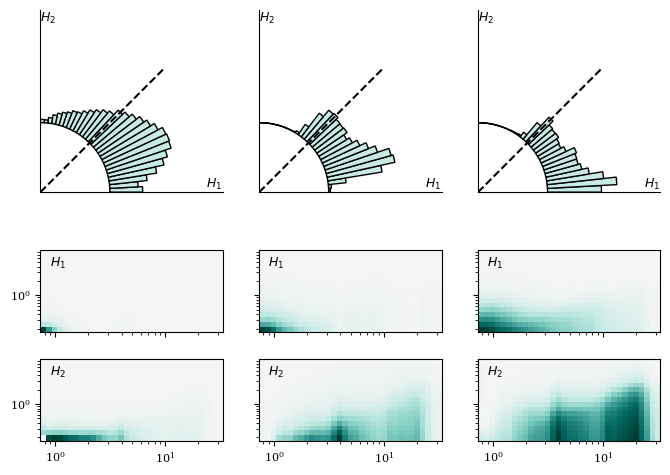

In [21]:
fig = plt.figure(figsize=(8,6))
gs = fig.add_gridspec(nrows=3,ncols=3,height_ratios=[3,1,1])

cmap = plt.colormaps.get_cmap('BrBG')
c = cmap(0.6)

for j in range(3):

    chunk.load_spectra(sc_path,name='second_order__dec')
    f1 = chunk.scattering_coefficients.f0.to_numpy()
    f2 = chunk.scattering_coefficients.f1.to_numpy()

    if j == 0:
        chunk.dim_reduction_unit(2,p=1,log1=False)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_unit()
    if j == 1:
        chunk.dim_reduction_unit(2,p=2,log1=False)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_unit()
    if j ==2:
        chunk.dim_reduction_unit(2,p=1,log1=True)#,alpha_H=0.1,alpha_W=0.1)
        chunk.embed_unit()


    #link = ds.LinkageClustering(chunk)
    # hel_S = np.sqrt(link.S_re)

    # h1 = hel_S[:,0]
    # h2 = hel_S[:,1]

    angle = np.arctan2(chunk.S_s[:,1],chunk.S_s[:,0])

    ax_hist = fig.add_subplot(gs[0,j],projection='polar')
    ax_hist.set_xlim(0,np.pi/2)

    hist, bins = np.histogram(angle,bins=np.linspace(0,np.pi/2,30),density=True)
    hist /= np.max(hist)
    ax_hist.bar(bins[:-1],hist,width=np.diff(bins),bottom=1,align='edge',ec='black',fc=c)

    ax_hist.set_yticks([])
    ax_hist.set_xticks([])
    ax_hist.vlines(np.pi/4,ymin=0,ymax=2.5,colors='black',linestyles='--')
    ax_hist.spines['polar'].set_visible(False)
    ax_hist.annotate(r'$H_1$',(0,2.5),ha='center',va='bottom')
    ax_hist.annotate(r'$H_2$',(np.pi/2,2.5),ha='left',va='center')

    # H = chunk.H

    # H *= chunk.sdX[None,:]

    # H_sum = np.sum(H,axis=1)

    # H /= H_sum[:,None]

    H = chunk.H_s

    max_basis = np.max(H)

    for i in range(2):
        basis_ax = fig.add_subplot(gs[i+1,j])
        basis = H[i,:]
        basis_2d = basis.reshape(f1.size,f2.size)
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')

        if i == 0:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            basis_ax.annotate(r'$H_1$',(0.05,0.8),xycoords='axes fraction')
        else:
            basis_ax.annotate(r'$H_2$',(0.05,0.8),xycoords='axes fraction')

        if j != 0:
            plt.setp(basis_ax.get_yticklabels(), visible=False)

#fig.savefig('two_component_basis.pdf',bbox_inches='tight',dpi=400)

In [41]:
#probably want to include amplitude with the two component version so I can see what I am doing to the feature space before worrying about the ten component version...

chunk.load_spectra(sc_path,name='second_order__dec')
f1 = chunk.scattering_coefficients.f0.to_numpy()
f2 = chunk.scattering_coefficients.f1.to_numpy()


#chunk.dim_reduction_norm(2,p=1,log1=True,alpha_H=0.1,alpha_W=0.1)
chunk.dim_reduction_cosine(20,p=1,log1=True)#,alpha_H=0.1,alpha_W=0.1)

In [42]:
chunk.embed_nmf_mod()

In [43]:
chunk.compute_linkage(alpha=0.0)

In [44]:
link = ds.LinkageClustering(chunk)
link.prune_cluster(20,min_size=10)
link.compute_centroids()

[49220   267    18     6     6     5     4     4     3     3     3     2
     1     1     1     1     1     1     1     1]
[49220   267    18     6     6     5     4     4     3     3     3     1
     1     1     1     1     1     1     1     1     1]
[49220   255    18    12     6     6     5     4     4     3     3     3
     1     1     1     1     1     1     1     1     1     1]
[49198   209    46    19    18    11     5     5     4     3     3     3
     3     3     3     2     1     1     1     1     1     1     1     1
     1     1     1     1     1     1]
[49220   255    18    12     6     5     4     4     3     3     3     3
     2     1     1     1     1     1     1     1     1     1     1     1]
[49220   255    18    11     6     5     4     4     3     3     3     3
     2     1     1     1     1     1     1     1     1     1     1     1
     1]
[49220   255    18    11     5     5     4     4     3     3     3     3
     2     1     1     1     1     1     1     1     1 

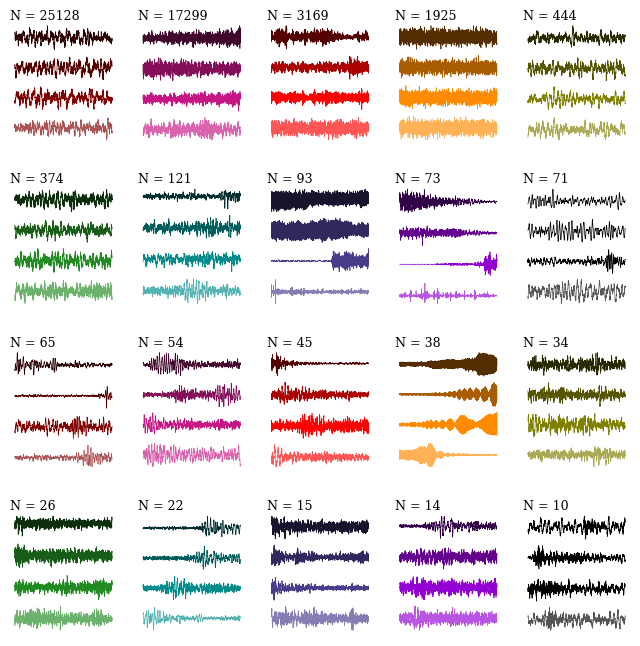

In [45]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4


fig, axes = plt.subplots(nrows=4,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

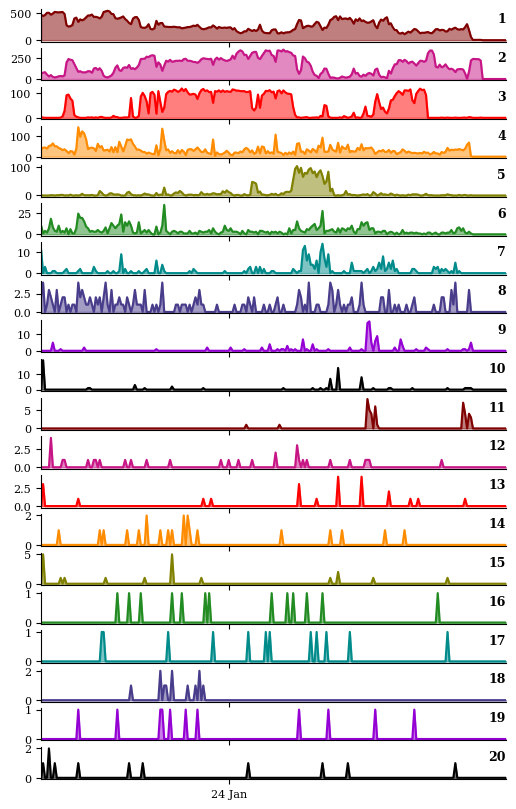

In [63]:
fig, ax = plt.subplots(nrows=20,sharex=True,sharey=False,figsize=(6,10))

times_bins = np.mgrid[t1:t2:1*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    ax[j].plot(times_bins_mt[:-1],time_hist,c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],time_hist,color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top')

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))

In [109]:
H = chunk.H

H_s = H * chunk.sdX[None,:]

#H_norm = np.linalg.norm(H,axis=1)
H_sum = np.sum(H_s,axis=1,keepdims=True)

#H = H / H_norm[:,None]
H_s /= H_sum

S = chunk.S

S = S * H_sum.T

G = H_s @ H_s.T #for defining the metric

L = np.linalg.cholesky(G) #decomposition of this metric for the embedding in euclidean space

S_norm = np.sum(S,axis=1,keepdims=True)

S /= S_norm #ensure this closure which was approximate

S_t = S @ L

In [110]:
L

array([[0.06257947, 0.        , 0.        ],
       [0.03166213, 0.07259985, 0.        ],
       [0.03651628, 0.04858228, 0.02746692]])

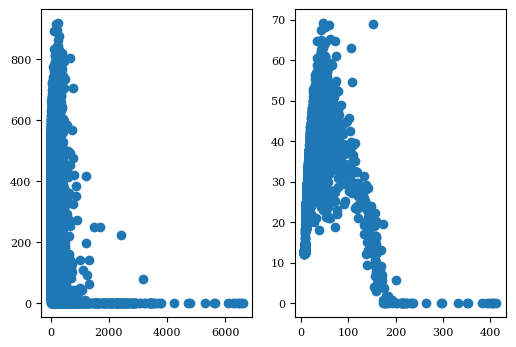

In [114]:
fig, ax = plt.subplots(ncols=2,figsize=(6,4))
ax[0].scatter(S[:,0] * chunk.X_sum,S[:,1] * chunk.X_sum)
ax[1].scatter(S_t[:,0] * chunk.X_sum,S_t[:,1] * chunk.X_sum)

In [24]:
chunk.sphere_nmf()

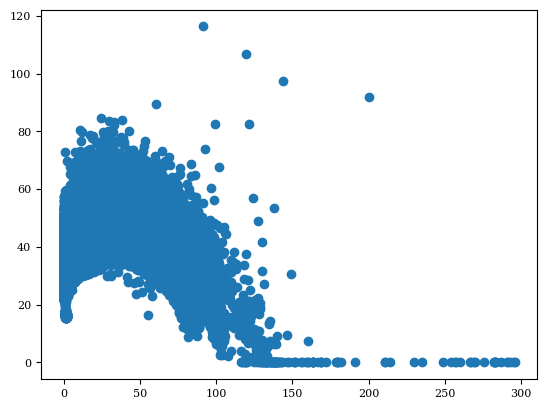

In [25]:
plt.scatter(chunk.S_re[:,0]*chunk.X_norm,chunk.S_re[:,1]*chunk.X_norm)

In [26]:
chunk.load_linkage(sc_path,'norm_nmf_' + str(2) + '_centroid_second_log1')

In [24]:
#clust = ds.DirectClustering(chunk)

In [25]:
#clust.amp_linkage(method='centroid')

In [27]:
link = ds.LinkageClustering(chunk)
link.prune_cluster(n_clusters=5,min_size=500)
link.compute_centroids()

[557648    104     22     11      3]
[557648    104     21     11      3      1]
[557648     99     21     11      5      3      1]
[557648     99     21      6      5      5      3      1]
[402188 155460     99     21      6      5      5      3      1]
[402188 155460     99     21      6      5      4      3      1      1]
[402188 134230  21230     99     21      6      5      4      3      1
      1]
[402188 134228  21230     99     21      6      5      4      3      2
      1      1]
[402188 134228  21165     99     65     21      6      5      4      3
      2      1      1]
[402188 134228  21165     99     65     21      6      5      4      2
      2      1      1      1]
[402188 134228  21165     99     65     21      6      5      3      2
      2      1      1      1      1]
[402188 134228  21165     99     65     12      9      6      5      3
      2      2      1      1      1      1]
[402188 134228  19773   1392     99     65     12      9      6      5
      3      2   

In [28]:
link.centroids

{np.int64(1): array([ 6.35701805, 33.31131802]),
 np.int64(2): array([33.09703565, 40.77231611]),
 np.int64(3): array([67.67170806, 32.26823751]),
 np.int64(4): array([100.19055308,  15.57320675]),
 np.int64(5): array([26.6943862 , 62.40515672])}

In [29]:
#fig = plt.figure(figsize=(8,8))
#ax = fig.add_subplot(111)
#ax.set_aspect('equal')
#ax.scatter(clust.S_re[:,0]*clust.X_sum,clust.S_re[:,1]*clust.X_sum,c=clust.labels)

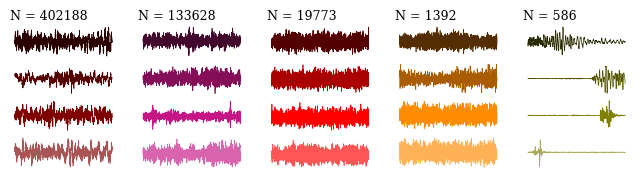

In [30]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4


fig, axes = plt.subplots(nrows=1,ncols=5,figsize=(8,2),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

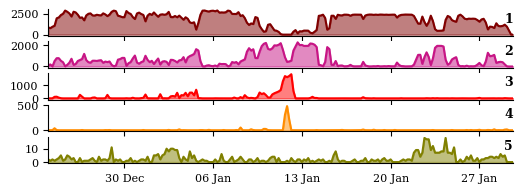

In [31]:
fig, ax = plt.subplots(nrows=5,sharex=True,sharey=False,figsize=(6,2))

times_bins = np.mgrid[t1:t2:4*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    ax[j].plot(times_bins_mt[:-1],time_hist,c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],time_hist,color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top')

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))

In [33]:
chunk.sphere_nmf()

In [35]:
link.centroids

{np.int64(1): array([ 6.35701805, 33.31131802]),
 np.int64(2): array([33.09703565, 40.77231611]),
 np.int64(3): array([67.67170806, 32.26823751]),
 np.int64(4): array([100.19055308,  15.57320675]),
 np.int64(5): array([26.6943862 , 62.40515672])}

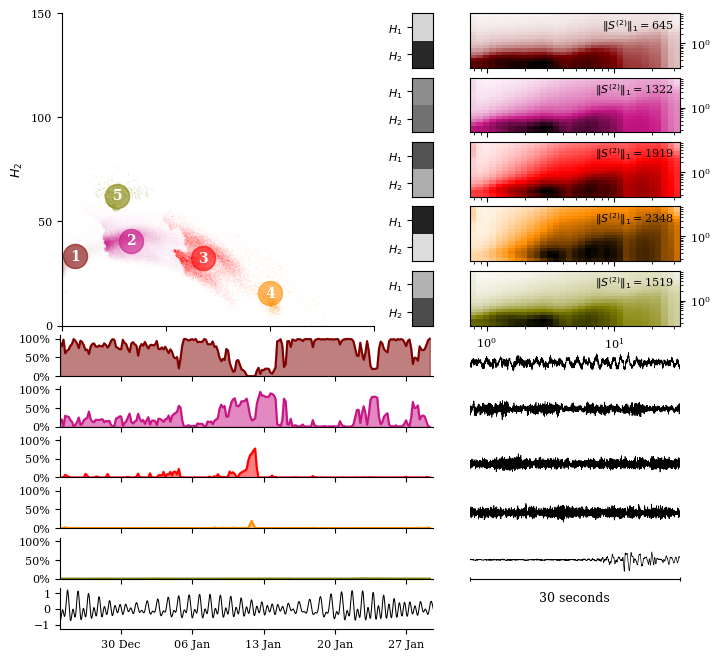

In [37]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4


n_bins = 30
fig = plt.figure(figsize=(8,8))

gs = fig.add_gridspec(ncols=3,nrows=11,width_ratios=(1.5,0.1,1),height_ratios=(1,1,1,1,1,3/4,3/4,3/4,3/4,3/4,3/4))

#ax_hist = fig.add_subplot(gs[0:5,0],projection='polar')

feature_ax = fig.add_subplot(gs[0:5,0])
feature_ax.set_aspect('equal')


chunk.load_spectra(sc_path,name='second_order__dec')
f1 = chunk.scattering_coefficients.f0.to_numpy()
f2 = chunk.scattering_coefficients.f1.to_numpy()


from matplotlib.colors import to_rgba

K = 5

X = link.S_re[:,0] * link.X_sum
Y = link.S_re[:,1] * link.X_sum

# Define common grid
xbins = np.linspace(0, 150, 300)
ybins = np.linspace(0, 150, 300)



colors = plt.cm.tab10(np.linspace(0, 1, K))

for j, cluster_name in enumerate(link.cluster_names):
    color = to_rgba(c[j])

    mask = (link.labels[link.ind] == cluster_name)
    H, xedges, yedges = np.histogram2d(
        X[mask], Y[mask],
        bins=[xbins, ybins]
    )

    H = H.T  # imshow expects (y, x)

    # Normalize (optional)
    H = H / H.max() if H.max() > 0 else H

    # Alpha: zero density → transparent
    alpha = np.clip(H, 0, 1)

    # Create RGBA image
    rgba = np.zeros((*H.shape, 4))
    rgba[..., :3] = color[:3]   # RGB
    rgba[..., 3] = alpha        # alpha channel

    feature_ax.imshow(
        rgba,
        origin='lower',
        extent=[xbins.min(), xbins.max(), ybins.min(), ybins.max()],
        interpolation='bilinear'
    )

    centre = link.centroids[cluster_name]

    feature_ax.scatter(centre[0],centre[1],c=c[j],s=300,alpha=0.6)
    feature_ax.annotate(cluster_name,centre,ha='center',va='center',weight='bold',color='white',fontsize=10)

feature_ax.spines['top'].set_visible(False)
feature_ax.spines['right'].set_visible(False)
feature_ax.set_xlabel(r'$H_1$')
feature_ax.set_ylabel(r'$H_2$')
feature_ax.set_xticks([0,50,100,150])
feature_ax.set_yticks([0,50,100,150])


#chunk.dim_reduction(2,p=1,log1=True,alpha_H=0.1,alpha_W=0.1)

# H = chunk.H

# H *= chunk.sdX[None,:]

# H /= np.sum(H,axis=1,keepdims=True)

H = link.H_re

centroids = np.stack([centroid for centroid in link.centroids.values()],axis=1).T
centroid_specs = centroids @ H

# hel_S = np.sqrt(link.S_re)

# h1 = hel_S[:,0]
# h2 = hel_S[:,1]

#angle = np.arctan2(link.S_re[:,1],link.S_re[:,0])

#ax_hist.set_xlim(0,np.pi/2)

#now need to loop through the clusters and do bar plots for each group...

# angle_lst = []
# cumulative_lst = []

# cumulative = np.zeros(n_bins)

# for j, name in enumerate(link.cluster_names):
#     angle_j = angle[link.labels[link.ind] == name]

#     hist, bins = np.histogram(angle_j,bins=np.linspace(0,np.pi/2,n_bins+1),density=False)

#     angle_lst.append(hist)
#     cumulative_lst.append(np.copy(cumulative))
#     cumulative += hist

# hist = np.stack(angle_lst,axis=1,dtype=np.float64)
# cumulative = np.stack(cumulative_lst,axis=1,dtype=np.float64)

# total = np.sum(hist,axis=1)

# hist /= np.max(total)
# cumulative /= np.max(total)

# for j, name in enumerate(link.cluster_names):
#     ax_hist.bar(bins[:-1],hist[:,j],width=np.diff(bins),bottom=1+cumulative[:,j],align='edge',ec='black',fc=c[j])


# ax_hist.set_yticks([])
# ax_hist.set_xticks([])
# #ax_hist.vlines(np.pi/4,ymin=0,ymax=2.5,colors='black',linestyles='--')
# ax_hist.spines['polar'].set_visible(False)
# ax_hist.annotate(r'$H_1$',(0,2.5),ha='center',va='bottom')
# ax_hist.annotate(r'$H_2$',(np.pi/2,2.5),ha='left',va='center')

max_spec = np.max(centroid_specs)


for j, name in enumerate(link.cluster_names):

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    centroid_ax = fig.add_subplot(gs[j,2])
    scale_ax = fig.add_subplot(gs[j,1])

    centroid = centroids[j,:]
    centroid /= np.sum(centroid)
    centroid_dss = centroid_specs[j,:]

    mag = np.sum(centroid_dss)

    max_basis = np.max(centroid_dss)

    centroid_2d = centroid_dss.reshape(f1.size,f2.size)
    centroid_ax.pcolormesh(f1,f2,centroid_2d.T,cmap=custom_cm,vmin=0)#,vmax=max_spec) #RdPu    
    centroid_ax.set_xscale('log')
    centroid_ax.set_yscale('log')

    centroid_ax.yaxis.set_ticks_position('right')
    centroid_ax.yaxis.set_label_position('right')

    centroid_ax.annotate(r'$\|S^{(2)}\|_1 = $' + str(int(np.round(mag))),(0.97,0.93),xycoords='axes fraction',va='top',ha='right',fontsize=8)

    centroid_weights = np.stack([centroid,centroid],axis=1)

    scale_ax.pcolormesh(np.array([0,1]),np.array([1,2]),centroid_weights,cmap='binary',vmin=0,vmax=1)
    scale_ax.set_xticks([])
    scale_ax.set_yticks([1,2],labels=[r'$H_1$',r'$H_2$'])
    scale_ax.invert_yaxis()

    if j != 4:
        plt.setp(centroid_ax.get_xticklabels(), visible=False)



bin_width = 4 * 60 * 60

times_bins = np.mgrid[t1:t2:bin_width] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

all_hist = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    all_hist.append(time_hist)

hist = np.stack(all_hist,axis=1,dtype=np.float64)
hist /= np.sum(hist,axis=1)[:,None]

all_tr_ax = []

for j, name in enumerate(link.cluster_names):
    
    time_ax = fig.add_subplot(gs[j+5,0:2])
    time_ax.plot(times_bins_mt[:-1],hist[:,j],c=c[j])
    #ax[j].set_ylim(0,360)
    time_ax.fill_between(times_bins_mt[:-1],hist[:,j],color=c[j],alpha=0.5)
    time_ax.set_xlim(times_bins_mt[0],times_bins_mt[-2])
    time_ax.spines['right'].set_visible(False)
    time_ax.spines['top'].set_visible(False)
    #time_ax.annotate(str(name),(1,1),xycoords='axes fraction',weight='bold',ha='right',va='bottom')

    myFmt = DateFormatter("%d %b")
    time_ax.xaxis.set_major_formatter(myFmt)
    time_ax.xaxis.set_major_locator(DayLocator(interval=7))
    
    time_ax.set_ylim(0,1.1)
    time_ax.set_yticks([0,0.5,1],labels=['0%','50%','100%'])

    #if j != 4:
    plt.setp(time_ax.get_xticklabels(), visible=False)

    tr_ax = fig.add_subplot(gs[j+5,-1])

    dist_j = link.dist[name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[name][sort_ind]
    sort_id = link.group_channels[name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    #ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')

    starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
    endtime = starttime + segment_duration_seconds
    seg = do.SeismicChunk(starttime,endtime)
    seg.attach_waveforms(inv,w_path,buffer=60)
    #print(seg.stream)
    seg.decimate(5)
    seg.filter('highpass',freq=1)
    stream = seg.stream.trim(starttime,endtime)
    net, sta, loc, cha = sort_id[i].split('.')
    #print(cluster_name,sta,stream)
    tr = stream.select(network=net,station=sta,channel=cha)[0]
    tr_ax.plot(tr.times()[:-1],tr.data[:-1],lw=0.5,color='black',rasterized=True)

    if j != 4:
        tr_ax.set_axis_off()
        tr_ax.set_xlim(0,30)


    else:
        tr_ax.spines['top'].set_visible(False)
        #waveform_ax.spines['bottom'].set_visible(False)
        tr_ax.spines['left'].set_visible(False)
        tr_ax.spines['right'].set_visible(False)
        tr_ax.set_xticks([0,30])
        #waveform_ax.set_yticks([])
        tr_ax.set_xticklabels(['',''])
        tr_ax.tick_params(direction='inout')
        tr_ax.set_xlabel('30 seconds')
        tr_ax.set_xlim(0,30)
        tr_ax.set_yticks([])

    all_tr_ax.append(tr_ax)

#max_tr = 1.5 * np.max(np.array([np.max(tr_ax.get_ylim()) for tr_ax in all_tr_ax]))

for tr_ax in all_tr_ax:
    ylim = tr_ax.get_ylim()
    ymin = 1.5*ylim[0]
    ymax = 2.5*ylim[1]
    tr_ax.set_ylim(ymin,ymax)

tide_ax = fig.add_subplot(gs[-1,0:2])

tide_times = np.full(dt.size,fill_value=t1) + dt
tide_times_mt = np.array([time.matplotlib_date for time in tide_times])
tide_ax.plot(tide_times_mt,tide,lw=0.75,color='k')
tide_ax.set_ylim(-1.3,1.3)
#tide_ax.set_ylabel('Tide Height (m)')
tide_ax.set_yticks([-1,0,1])

tide_ax.spines['top'].set_visible(False)
#tide_ax.spines['bottom'].set_visible(False)
tide_ax.spines['right'].set_visible(False)

myFmt = DateFormatter("%d %b")
tide_ax.xaxis.set_major_formatter(myFmt)
tide_ax.xaxis.set_major_locator(DayLocator(interval=7))

tide_ax.set_xlim(times_bins_mt[0],times_bins_mt[-2])


fig.savefig('2_component_clustering_amp.pdf',bbox_inches='tight',dpi=400)

In [38]:
from scipy.stats import gaussian_kde
from scipy.signal import hilbert


tides = np.load('totten_tides.npz')
dt = tides['dt']
tide = tides['tide']

tide = tide[dt <= (t2 - t1)]
dt = dt[dt <= (t2 - t1)]

analytic_signal = hilbert(tide)
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.unwrap(np.angle(analytic_signal))
tidal_phase = (instantaneous_phase % (2*np.pi) - np.pi) * 180/np.pi

tidal_phase += 180
tidal_phase[tidal_phase > 180] -= 360

In [39]:
group_hists = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    timedeltas = [np.timedelta64(time,'s').astype(np.float64) for time in np.array(times) - np.datetime64(t1)]

    window_phi = np.interp(timedeltas,dt,tidal_phase)

    dphi = 10
    phi = np.mgrid[-180:181:dphi]

    hist, _ = np.histogram(window_phi,bins=phi)

    group_hists.append(hist)

all_hist = np.stack(group_hists,axis=1,dtype=np.float64)
dens = all_hist / np.sum(all_hist,axis=1,keepdims=True)

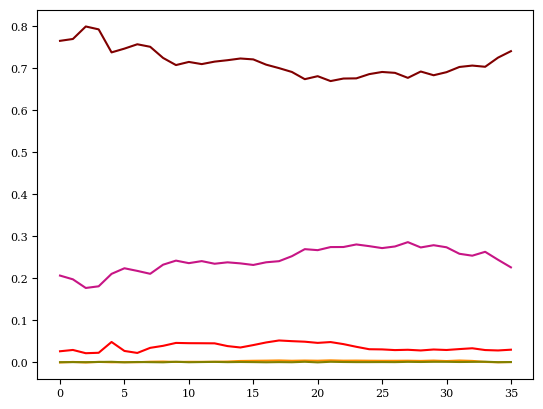

In [40]:

fig = plt.figure()
ax = fig.add_subplot(111)

for j, name in enumerate(link.cluster_names):

    ax.plot(dens[:,j],color=c[j])

In [41]:
group_hists = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]

    time_since_midnight = (times - times.astype('datetime64[D]')).astype('timedelta64[s]').astype(np.float64)
    dhrs = time_since_midnight / 60 / 60

    hrs = np.mgrid[0:24.01:1]

    hist, _ = np.histogram(dhrs,bins=hrs)

    group_hists.append(hist)

all_hist = np.stack(group_hists,axis=1,dtype=np.float64)
dens = all_hist / np.sum(all_hist,axis=1,keepdims=True)

(0.0, 1.0)

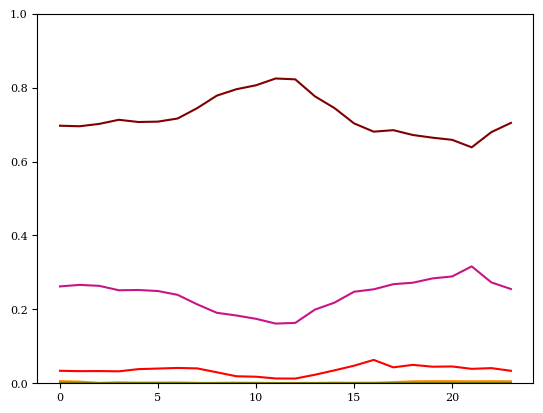

In [42]:

fig = plt.figure()
ax = fig.add_subplot(111)

for j, name in enumerate(link.cluster_names):

    ax.plot(dens[:,j],color=c[j])

ax.set_ylim(0,1)

In [43]:
group_hists = []

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    timedeltas = [np.timedelta64(time,'s').astype(np.float64) for time in np.array(times) - np.datetime64(t1)]

    window_height = np.interp(timedeltas,dt,tide)

    dh = 0.1
    h = np.mgrid[-1.3:1.3:dh]

    hist, _ = np.histogram(window_height,bins=h)

    group_hists.append(hist)

all_hist = np.stack(group_hists,axis=1,dtype=np.float64)
dens = all_hist / np.sum(all_hist,axis=1,keepdims=True)

(0.0, 1.0)

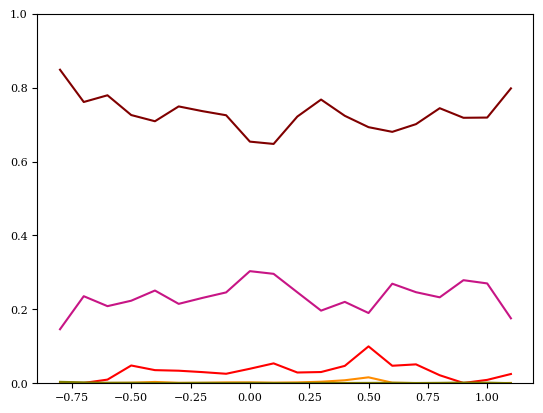

In [44]:

fig = plt.figure()
ax = fig.add_subplot(111)

for j, name in enumerate(link.cluster_names):

    ax.plot(h[:-1],dens[:,j],color=c[j])

ax.set_ylim(0,1)

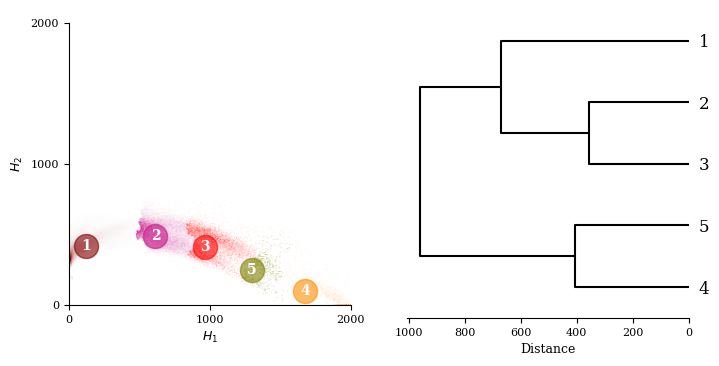

In [ ]:
# Assume:
# X, Y: coordinates
# labels: cluster labels (0..K-1)

from matplotlib.colors import to_rgba

K = 5

X = link.S_re[:,0] * link.X_sum
Y = link.S_re[:,1] * link.X_sum

# Define common grid
xbins = np.linspace(0, 2000, 300)
ybins = np.linspace(0, 2000, 300)

fig = plt.figure(figsize=(8,4))

gs = fig.add_gridspec(ncols=2)

feature_ax = fig.add_subplot(gs[0])
feature_ax.set_aspect('equal')

colors = plt.cm.tab10(np.linspace(0, 1, K))

for j, cluster_name in enumerate(link.cluster_names):
    color = to_rgba(c[j])

    mask = (link.labels[link.ind] == cluster_name)
    H, xedges, yedges = np.histogram2d(
        X[mask], Y[mask],
        bins=[xbins, ybins]
    )

    H = H.T  # imshow expects (y, x)

    # Normalize (optional)
    H = H / H.max() if H.max() > 0 else H

    # Alpha: zero density → transparent
    alpha = np.clip(H, 0, 1)

    # Create RGBA image
    rgba = np.zeros((*H.shape, 4))
    rgba[..., :3] = color[:3]   # RGB
    rgba[..., 3] = alpha        # alpha channel

    feature_ax.imshow(
        rgba,
        origin='lower',
        extent=[xbins.min(), xbins.max(), ybins.min(), ybins.max()],
        interpolation='bilinear'
    )

    centre = link.centroids[cluster_name]

    feature_ax.scatter(centre[0],centre[1],c=c[j],s=300,alpha=0.6)
    feature_ax.annotate(cluster_name,centre,ha='center',va='center',weight='bold',color='white',fontsize=10)

feature_ax.spines['top'].set_visible(False)
feature_ax.spines['right'].set_visible(False)
feature_ax.set_xlabel(r'$H_1$')
feature_ax.set_ylabel(r'$H_2$')
feature_ax.set_xticks([0,1000,2000])
feature_ax.set_yticks([0,1000,2000])


P = np.stack([centre for centre in link.centroids.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)

linkage = hierarchy.linkage(pdist, method="centroid",metric='euclidean',optimal_ordering=True)

dend_ax = fig.add_subplot(gs[1])

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=False,above_threshold_color='black')

dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)
dend_ax.spines['top'].set_visible(False)
dend_ax.set_xlabel('Distance')

fig.savefig('centroid_linkage_2d.pdf',bbox_inches='tight',dpi=400)

In [53]:
link.prune_cluster(n_clusters=20,min_size=50)
link.compute_centroids()

[402188 134214  19773   1392     72     65     23     14     12      9
      6      5      4      3      2      2      1      1      1      1]
[402188 134214  19773   1392     72     65     23     14     12      9
      6      4      3      3      2      2      2      1      1      1
      1]
[402188 133628  19773   1392    586     72     65     23     14     12
      9      6      4      3      3      2      2      2      1      1
      1      1]
[402188 133628  19773   1166    586    226     72     65     23     14
     12      9      6      4      3      3      2      2      2      1
      1      1      1]
[402188 133628  19773   1166    586    226     72     65     23     14
     12      9      6      4      3      3      2      2      1      1
      1      1      1      1]
[402188  77507  56121  19773   1166    586    226     72     65     23
     14     12      9      6      4      3      3      2      2      1
      1      1      1      1      1]
[402188  77503  56121  19773   1

Text(0.5, 0, 'Distance')

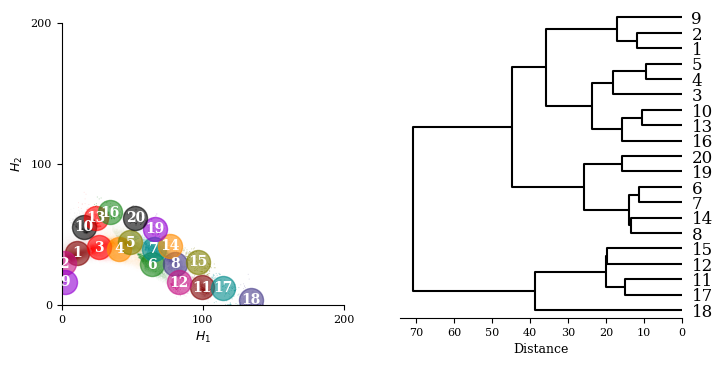

In [54]:
from matplotlib.colors import to_rgba

K = 5

X = link.S_re[:,0] * link.X_sum
Y = link.S_re[:,1] * link.X_sum

# Define common grid
xbins = np.linspace(0, 200, 300)
ybins = np.linspace(0, 200, 300)

fig = plt.figure(figsize=(8,4))

gs = fig.add_gridspec(ncols=2)

feature_ax = fig.add_subplot(gs[0])
feature_ax.set_aspect('equal')


for j, cluster_name in enumerate(link.cluster_names):
    color = to_rgba(c[j])

    mask = (link.labels[link.ind] == cluster_name)
    H, xedges, yedges = np.histogram2d(
        X[mask], Y[mask],
        bins=[xbins, ybins]
    )

    H = H.T  # imshow expects (y, x)

    # Normalize (optional)
    H = H / H.max() if H.max() > 0 else H

    # Alpha: zero density → transparent
    alpha = np.clip(H, 0, 1)

    # Create RGBA image
    rgba = np.zeros((*H.shape, 4))
    rgba[..., :3] = color[:3]   # RGB
    rgba[..., 3] = alpha        # alpha channel

    feature_ax.imshow(
        rgba,
        origin='lower',
        extent=[xbins.min(), xbins.max(), ybins.min(), ybins.max()],
        interpolation='bilinear'
    )

    centre = link.centroids[cluster_name]

    feature_ax.scatter(centre[0],centre[1],c=c[j],s=300,alpha=0.6)
    feature_ax.annotate(cluster_name,centre,ha='center',va='center',weight='bold',color='white',fontsize=10)

feature_ax.spines['top'].set_visible(False)
feature_ax.spines['right'].set_visible(False)
feature_ax.set_xlabel(r'$H_1$')
feature_ax.set_ylabel(r'$H_2$')
feature_ax.set_xticks([0,100,200])
feature_ax.set_yticks([0,100,200])

feature_ax.set_xlim(0,200)
feature_ax.set_ylim(0,200)


P = np.stack([centre for centre in link.centroids.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)

linkage = hierarchy.linkage(pdist, method="centroid",metric='euclidean',optimal_ordering=True)

dend_ax = fig.add_subplot(gs[1])

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=False,above_threshold_color='black')

dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)
dend_ax.spines['top'].set_visible(False)
dend_ax.set_xlabel('Distance')

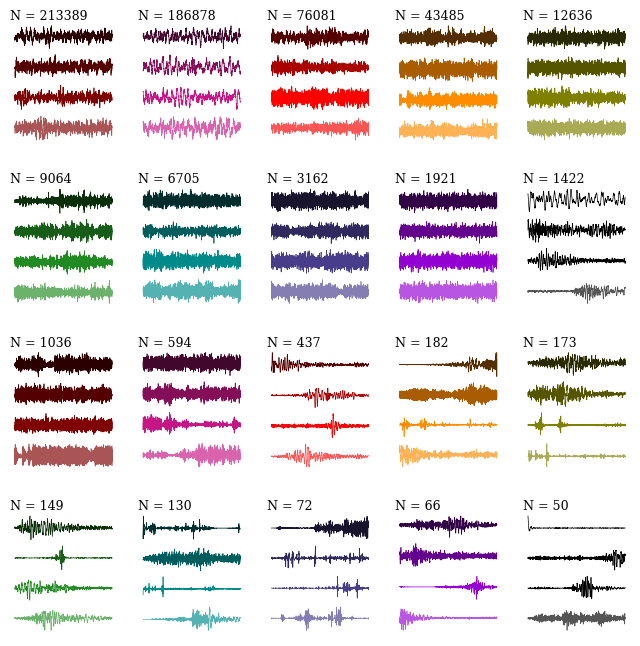

In [55]:
fig, axes = plt.subplots(nrows=4,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i+5]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i+5].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

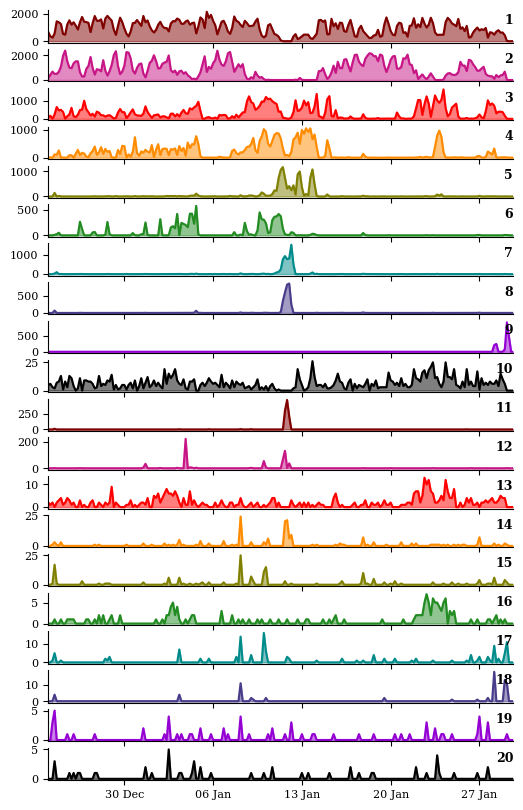

In [56]:
fig, ax = plt.subplots(nrows=20,sharex=True,sharey=False,figsize=(6,10))

times_bins = np.mgrid[t1:t2:4*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    ax[j].plot(times_bins_mt[:-1],time_hist,c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],time_hist,color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top')

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))

In [ ]:
#now look at the 5/10 dimensional cases...

In [121]:
chunk.load_linkage(sc_path,'nmf_' + str(5) + '_centroid_second_log1')

In [124]:
link = ds.LinkageClustering(chunk)
link.prune_cluster(n_clusters=10,min_size=50)
link.compute_centroids()

[549192   8462     85     21     19      4      2      1      1      1]
[549192   8462     85     19     11     10      4      2      1      1
      1]
[549192   8462     85     19     11     10      3      2      1      1
      1      1]
[549192   7298   1164     85     19     11     10      3      2      1
      1      1      1]
[549192   7297   1164     85     19     11     10      3      2      1
      1      1      1      1]
[549192   7297   1164     85     19     11     10      3      1      1
      1      1      1      1      1]
[549192   7297   1164     85     18     11     10      3      1      1
      1      1      1      1      1      1]
[549192   7297   1164     85     11     10      9      9      3      1
      1      1      1      1      1      1      1]
[549192   6713   1164    584     85     11     10      9      9      3
      1      1      1      1      1      1      1      1]
[549192   6712   1164    584     85     11     10      9      9      3
      1      1      1

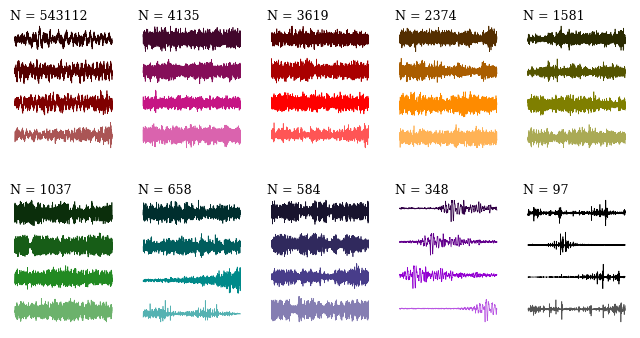

In [125]:
fig, axes = plt.subplots(nrows=2,ncols=5,figsize=(8,4),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i+5]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i+5].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

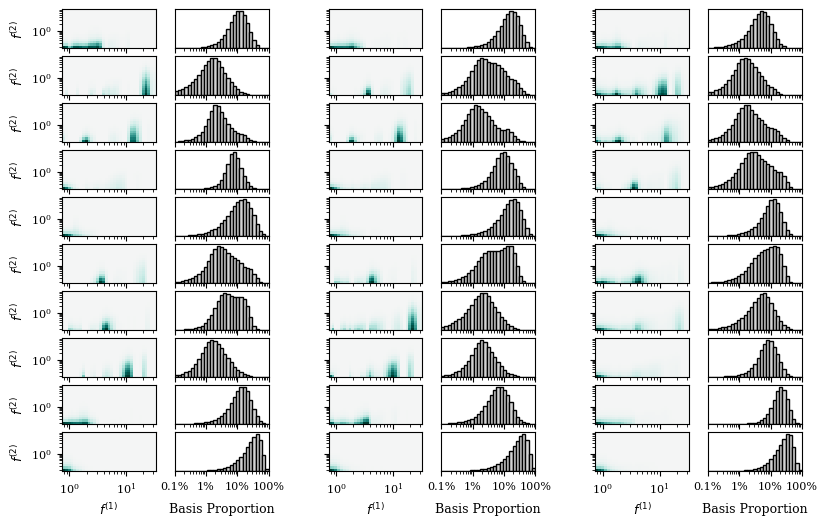

In [36]:
#when using log scaling, all cases of p become the same, so can instead do first and second order in one plot...
master_fig = plt.figure(figsize=(8,6))

alpha = [0.0,0.01,0.1]

fig_gs = master_fig.add_gridspec(ncols=3)

norm_fig = master_fig.add_subfigure(fig_gs[0])
sqrt_fig = master_fig.add_subfigure(fig_gs[1])
log_fig = master_fig.add_subfigure(fig_gs[2])

j = 0
for fig in [norm_fig, sqrt_fig, log_fig]:

    chunk.load_spectra(sc_path,name='second_order__dec')
    f1 = chunk.scattering_coefficients.f0.to_numpy()
    f2 = chunk.scattering_coefficients.f1.to_numpy()


    ax_gs = fig.add_gridspec(nrows=10,ncols=2)

    chunk.dim_reduction(n_components=10,p=1,log1=False,alpha_H=alpha[j],alpha_W=alpha[j])
    
    H = chunk.H

    H *= chunk.sdX[None,:]

    #H_norm = np.linalg.norm(H,axis=1)
    H_sum = np.sum(H,axis=1)

    #H = H / H_norm[:,None]
    H /= H_sum[:,None]

    S = chunk.S
    #S = S * H_norm[None,:]
    S *= H_sum[None,:]

    S_norm = np.sum(S,axis=1,keepdims=True)

    S /= S_norm

    #sens_ax = fig.add_subplot(ax_gs[0,0])

    #sens = 1 / chunk.sdX
    #sens_2d = sens.reshape(f1.size,f2.size)
    #sens_ax.pcolormesh(f1,f2,np.log10(sens_2d.T),cmap='BuPu') #RdPu
    #sens_ax.set_xscale('log')
    #sens_ax.set_yscale('log')

    max_basis = np.max(H)


    for i in range(10):

        basis_ax = fig.add_subplot(ax_gs[i,0])

        basis = H[i,:]
        #max_basis = np.max(np.absolute(basis))
        basis_2d = basis.reshape(f1.size,f2.size)
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap=new_cmap,vmin=0) #RdPu    
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')

        S_bins = np.logspace(-3,0,30)
        hist, bins = np.histogram(S[:,i],bins=S_bins,density=False)

        hist_ax = fig.add_subplot(ax_gs[i,1])
        hist_ax.bar(S_bins[:-1],height=hist,width=np.diff(S_bins),align='edge',facecolor='lightgrey',edgecolor='black')
        hist_ax.set_xscale('log')
        hist_ax.set_yticks([])
        hist_ax.set_xticks([1e-3,1e-2,1e-1,1e0],labels=['0.1%','1%','10%','100%'])
        hist_ax.set_xlim(S_bins[0],S_bins[-1])

        if i != 9:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            plt.setp(hist_ax.get_xticklabels(), visible=False)

        if j != 0:
            plt.setp(basis_ax.get_yticklabels(), visible=False)

        if j == 0:
            basis_ax.set_ylabel(r'$f^{(2)}$')


    basis_ax.set_xlabel(r'$f^{(1)}$')
    hist_ax.set_xlabel('Basis Proportion',labelpad=8)
    
    j += 1

In [26]:
clust = ds.DirectClustering(chunk)

In [60]:
#clust.S_re /= np.std(clust.S_re,axis=0,keepdims=True)

In [27]:
clust.direct_cluster()
clust.compute_dist()

In [62]:
#clust.compute_linkage(pca_comp=2,method='centroid',eps=1e-10,alpha=0)

In [63]:
#clust.prune_cluster(n_clusters=40,min_size=10)
#clust.compute_centroids()

Skipping plot
Skipping plot
Skipping plot
Skipping plot


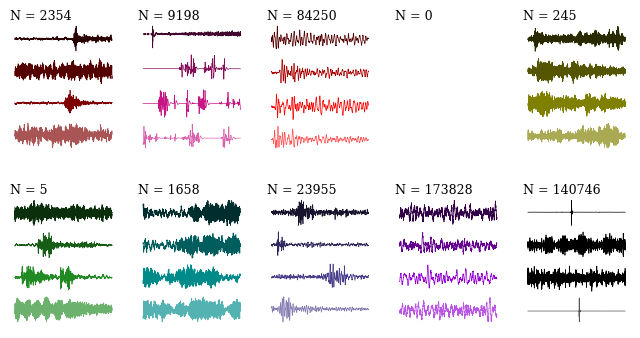

In [29]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4


fig, axes = plt.subplots(nrows=2,ncols=5,figsize=(8,4),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')

for j, cluster_name in enumerate(clust.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = clust.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = clust.group_times[cluster_name][sort_ind]
    sort_id = clust.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

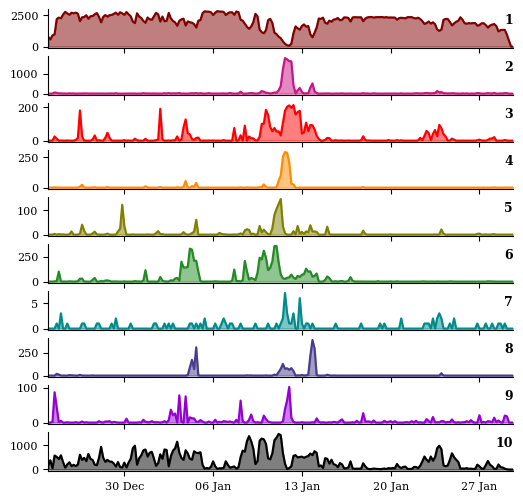

In [65]:
fig, ax = plt.subplots(nrows=10,sharex=True,sharey=False,figsize=(6,6))

times_bins = np.mgrid[t1:t2:4*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

for j, name in enumerate(clust.cluster_names):
    times = clust.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    ax[j].plot(times_bins_mt[:-1],time_hist,c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],time_hist,color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top')

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))

In [ ]:
clust.centroids.shape

(20, 10)

In [ ]:
chunk.load_linkage(sc_path,'ward_second_p1')

In [ ]:
link = ds.LinkageClustering(chunk)

In [ ]:
labels = link.prune_cluster(n_clusters=20,min_size=20)

[557761      6      2      2      2      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1]
[557761      6      2      2      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1]
[557761      6      2      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1]
[557761      4      2      2      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1]
[557761      4      2      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1]
[557761      4      1      1      1      1      1      1      1      1
      1      1      1      1      1      1      1      1      1      1
      1      1      1      1      1]
[557761      3      1      1    

In [ ]:
link.compute_centroids()

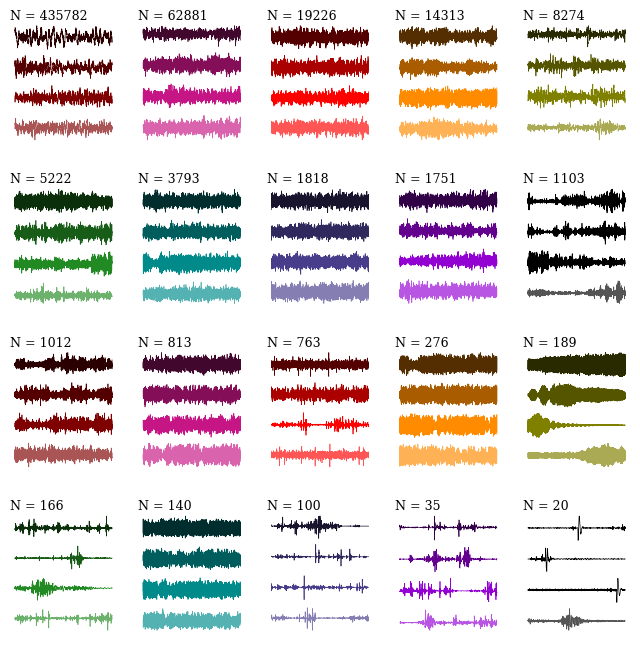

In [ ]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 4
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

fig, axes = plt.subplots(nrows=4,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')
for j, cluster_name in enumerate(link.cluster_names):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.decimate(5)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

#fig.savefig('coloured_clusters.pdf',dpi=400,bbox_inches='tight')

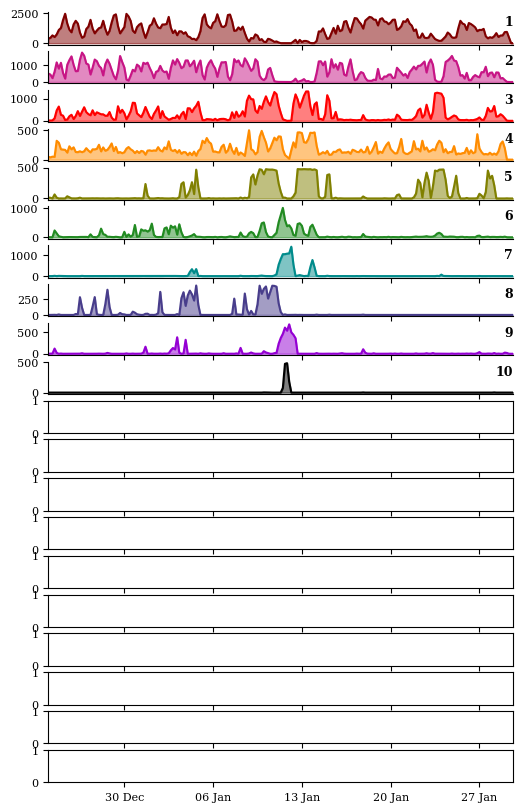

In [ ]:
fig, ax = plt.subplots(nrows=20,sharex=True,sharey=False,figsize=(6,10))

times_bins = np.mgrid[t1:t2:4*60*60] #60 minute bins
times_bins_mt = np.array([t.matplotlib_date for t in times_bins])

for j, name in enumerate(link.cluster_names):
    times = link.group_times[name]
    times_mt = np.array([UTCDateTime(pd.to_datetime(t)).matplotlib_date for t in times])
    time_hist, _ = np.histogram(times_mt,bins=times_bins_mt)
    ax[j].plot(times_bins_mt[:-1],time_hist,c=c[j])
    #ax[j].set_ylim(0,360)
    ax[j].fill_between(times_bins_mt[:-1],time_hist,color=c[j],alpha=0.5)
    ax[j].set_xlim(times_bins_mt[0],times_bins_mt[-2])
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['top'].set_visible(False)
    ax[j].annotate(str(name),(1,0.9),xycoords='axes fraction',weight='bold',ha='right',va='top')

    myFmt = DateFormatter("%d %b")
    ax[j].xaxis.set_major_formatter(myFmt)
    ax[j].xaxis.set_major_locator(DayLocator(interval=7))

fig.savefig('cluster_timeseries.pdf',bbox_inches='tight')

In [ ]:
#plot the dendrogram for the clusters...try and put the centroid waveform alongside each of the branches, but need to drop branches below size?
#might be easier to remake the dendrogram from scratch using the centroids computed earlier...

In [ ]:
P = np.stack([centre for centre in link.centroids.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)

In [ ]:
linkage = hierarchy.linkage(pdist, method="ward",metric='euclidean',optimal_ordering=True)

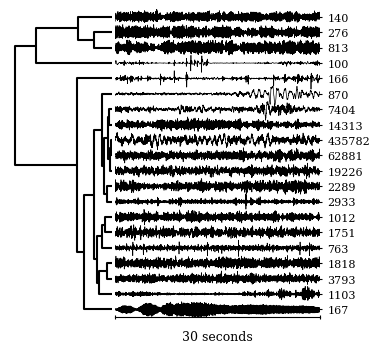

In [ ]:
fig, [dend_ax, waveform_ax] = plt.subplots(figsize=(4,4),ncols=2,gridspec_kw={'wspace':0.02},width_ratios=[1,2])

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=True,above_threshold_color='black')

cluster_sizes = []
for i, cluster_name in enumerate(dendrogram['ivl']):

    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size

        #tr = group[cluster_name][i,0,:]
    starttime = UTCDateTime(pd.to_datetime(sort_t[0]))
    endtime = starttime + segment_duration_seconds
    seg = do.SeismicChunk(starttime,endtime)
    seg.attach_waveforms(inv,w_path,buffer=60)
    seg.decimate(5)
    seg.filter('highpass',freq=1)
    stream = seg.stream.trim(starttime,endtime)
    net, sta, loc, cha = sort_id[0].split('.')
    tr = stream.select(network=net,station=sta,channel=cha)[0]


    offset = 5 + i * 10

    waveform_ax.plot(tr.times()[:-1],tr.data[:-1]/tr.data[:-1].max()*5 + offset,lw=0.5,color='black')#c[cluster_name-1])
    cluster_sizes.append(N_j)

sorted_y_labels = dendrogram['ivl']# [link.cluster_names[key] for key in dendrogram['ivl']]

waveform_ax.set_ylim((0,link.cluster_names.size*10))
waveform_ax.set_yticks(np.arange(0,link.cluster_names.size*10,10)+5)
waveform_ax.set_yticklabels(cluster_sizes)
#waveform_ax.set_yticklabels(sorted_y_labels)
waveform_ax.yaxis.set_ticks_position('right')

waveform_ax.spines['top'].set_visible(False)
#waveform_ax.spines['bottom'].set_visible(False)
waveform_ax.spines['left'].set_visible(False)
waveform_ax.spines['right'].set_visible(False)

waveform_ax.set_xticks([0,30])
#waveform_ax.set_yticks([])
waveform_ax.set_xticklabels(['',''])
waveform_ax.tick_params(direction='inout')
waveform_ax.set_xlabel('30 seconds')
waveform_ax.set_xlim(0,30)

dend_ax.spines['top'].set_visible(False)
dend_ax.spines['bottom'].set_visible(False)
dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)

dend_ax.set_xticks([])

fig.savefig('dendrogram_first_p1.pdf',bbox_inches='tight',dpi=400)

## Second Order Scattering Spectra

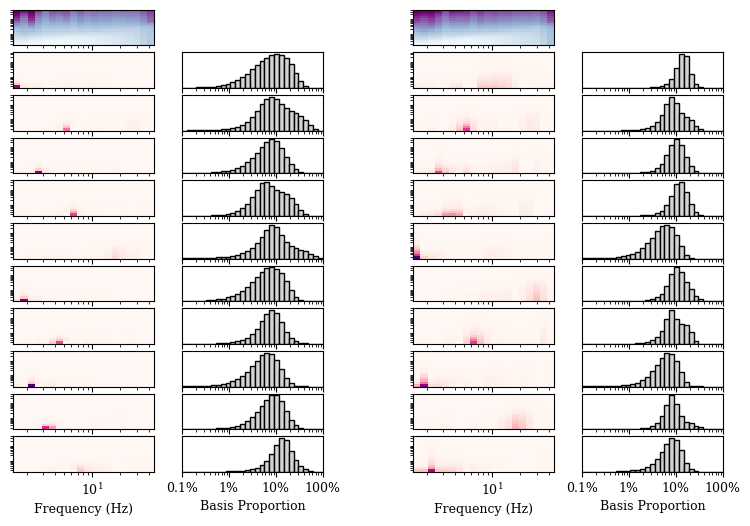

In [ ]:
chunk.load_spectra(sc_path,name='second_order')

master_fig = plt.figure(figsize=(8,6))

fig_gs = master_fig.add_gridspec(ncols=2)

norm_fig = master_fig.add_subfigure(fig_gs[0])
sqrt_fig = master_fig.add_subfigure(fig_gs[1])

j = 0
for fig in [norm_fig, sqrt_fig]:

    ax_gs = fig.add_gridspec(nrows=11,ncols=2)

    if j == 0:
        chunk.load_dim_reduction(sc_path,name='second_order_p1')
    else:
        chunk.load_dim_reduction(sc_path,name='second_order_p2')

    S_norm = chunk.S / np.sum(chunk.S,axis=1)[:,None]
    max_basis = np.max(chunk.H)

    sens_ax = fig.add_subplot(ax_gs[0,0])

    sens = 1 / chunk.sdX
    sens_2d = sens.reshape((n1,n2))
    sens_ax.pcolormesh(f1,f2,np.log10(sens_2d.T),cmap='BuPu') #RdPu
    sens_ax.set_xscale('log')
    sens_ax.set_yscale('log')
    sens_ax.set_yticks([])

    for i in range(10):

        basis_ax = fig.add_subplot(ax_gs[i+1,0])
        basis = chunk.H[i,:]
        basis_2d = basis.reshape((n1,n2))
        basis_ax.pcolormesh(f1,f2,basis_2d.T,cmap='RdPu',vmin=0,vmax=max_basis) #RdPu
        basis_ax.set_xscale('log')
        basis_ax.set_yscale('log')
        basis_ax.set_yticks([])

        S_bins = np.logspace(-3,0,30,base=10)
        hist, bins = np.histogram(S_norm[:,i],bins=S_bins,density=False)

        hist_ax = fig.add_subplot(ax_gs[i+1,1])
        hist_ax.bar(S_bins[:-1],height=hist,width=np.diff(S_bins),align='edge',facecolor='lightgrey',edgecolor='black')
        hist_ax.set_xscale('log')
        hist_ax.set_yticks([])
        hist_ax.set_xticks([1e-3,1e-2,1e-1,1e0],labels=['0.1%','1%','10%','100%'])
        hist_ax.set_xlim(1e-3,1e0)
        hist_ax.set_xlim(S_bins[0],S_bins[-1])

        #basis_ax.set_ylabel(i+1)

        if i != 9:
            plt.setp(basis_ax.get_xticklabels(), visible=False)
            plt.setp(hist_ax.get_xticklabels(), visible=False)


    basis_ax.set_xlabel('Frequency (Hz)')
    hist_ax.set_xlabel('Basis Proportion')
    
    j += 1

master_fig.savefig('combined_second_order_basis.pdf',bbox_inches='tight',dpi=400)

In [ ]:
chunk.load_linkage(sc_path,'ward_second_p2')

In [ ]:
link = ds.LinkageClustering(chunk)

In [ ]:
labels = link.prune_cluster(n_clusters=20,min_size=20)

In [ ]:
link.compute_centroids(cosine=False)

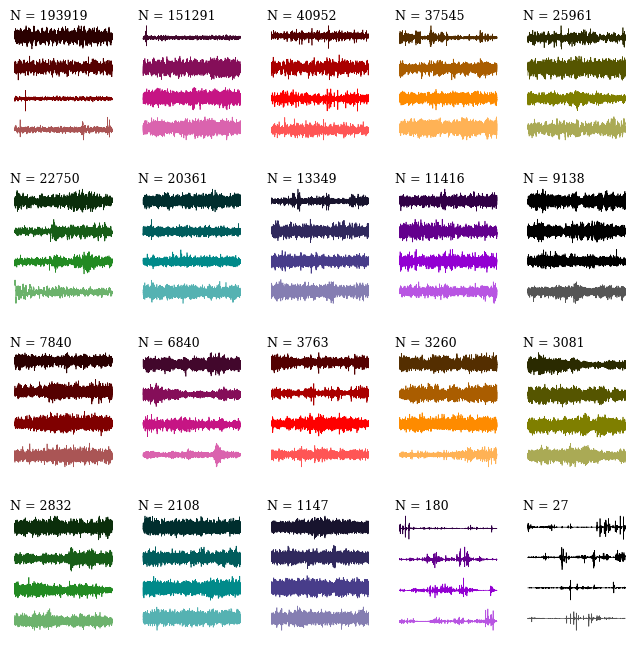

In [ ]:
c = ['maroon','mediumvioletred','red','darkorange','olive','forestgreen','darkcyan','darkslateblue','darkviolet','black'] * 3
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

fig, axes = plt.subplots(nrows=4,ncols=5,figsize=(8,8),gridspec_kw={'hspace':0.3})
axes = axes.flatten(order='C')
for j, cluster_name in enumerate(link.cluster_names[:20]):
    ax = axes[j]
    ax.set_axis_off()

    #ax.annotate(cluster_name,(0,1),xycoords='axes fraction')
    #ax.annotate('threshold: ' + str(threshold_dict[group]),(1,0),xycoords='axes fraction',ha='right',va='top')

    left = mcolors.to_rgb('white')
    middle = mcolors.to_rgb(c[j])
    right = mcolors.to_rgb('black')
    custom_cm = LinearSegmentedColormap.from_list('custom',[left,middle,right])

    #can try and sort by distance to cluster centre and get the centroid events...
    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size
    ax.annotate('N = ' + str(N_j),(0,1),xycoords='axes fraction')


    for i in range(4):
        frac = (i+2) / (4+2)

        offset = 10*i
        #tr = group[cluster_name][i,0,:]
        try:
            starttime = UTCDateTime(pd.to_datetime(sort_t[i]))
            endtime = starttime + segment_duration_seconds
            seg = do.SeismicChunk(starttime,endtime)
            seg.attach_waveforms(inv,w_path,buffer=60)
            #print(seg.stream)
            seg.filter('highpass',freq=1)
            stream = seg.stream.trim(starttime,endtime)
            net, sta, loc, cha = sort_id[i].split('.')
            #print(cluster_name,sta,stream)
            tr = stream.select(network=net,station=sta,channel=cha)[0].data[:-1].__array__()
            ax.plot(tr/np.abs(tr).max()*4 + offset,lw=0.5,color=custom_cm(frac),rasterized=True)
        except IndexError:
            print('Skipping plot')

        i += 1

#fig.savefig('coloured_clusters.pdf',dpi=400,bbox_inches='tight')

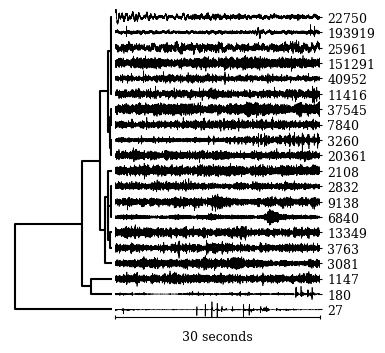

In [ ]:
P = np.stack([centre for centre in link.centroids.values()],axis=0)
pdist = distance.pdist(P,metric='euclidean')
D = distance.squareform(pdist)
linkage = hierarchy.linkage(pdist, method="ward",metric='euclidean',optimal_ordering=True)

fig, [dend_ax, waveform_ax] = plt.subplots(figsize=(4,4),ncols=2,gridspec_kw={'wspace':0.02},width_ratios=[1,2])

dendrogram = hierarchy.dendrogram(linkage,color_threshold=0,orientation='left',ax=dend_ax,labels=link.cluster_names,no_labels=True,above_threshold_color='black')

cluster_sizes = []
for i, cluster_name in enumerate(dendrogram['ivl']):

    dist_j = link.dist[cluster_name]
    sort_ind = np.argsort(dist_j)
    sort_t = link.group_times[cluster_name][sort_ind]
    sort_id = link.group_channels[cluster_name][sort_ind]
    #sort_tr = group[cluster_name][sort_ind,:]

    N_j = dist_j.size

        #tr = group[cluster_name][i,0,:]
    starttime = UTCDateTime(pd.to_datetime(sort_t[0]))
    endtime = starttime + segment_duration_seconds
    seg = do.SeismicChunk(starttime,endtime)
    seg.attach_waveforms(inv,w_path,buffer=60)
    seg.filter('highpass',freq=1)
    stream = seg.stream.trim(starttime,endtime)
    net, sta, loc, cha = sort_id[0].split('.')
    tr = stream.select(network=net,station=sta,channel=cha)[0]


    offset = 5 + i * 10

    waveform_ax.plot(tr.times()[:-1],tr.data[:-1]/tr.data[:-1].max()*5 + offset,lw=0.5,color='black')#c[cluster_name-1])
    cluster_sizes.append(N_j)

sorted_y_labels = dendrogram['ivl']# [link.cluster_names[key] for key in dendrogram['ivl']]

waveform_ax.set_ylim((0,link.cluster_names.size*10))
waveform_ax.set_yticks(np.arange(0,link.cluster_names.size*10,10)+5)
waveform_ax.set_yticklabels(cluster_sizes)
#waveform_ax.set_yticklabels(sorted_y_labels)
waveform_ax.yaxis.set_ticks_position('right')

waveform_ax.spines['top'].set_visible(False)
#waveform_ax.spines['bottom'].set_visible(False)
waveform_ax.spines['left'].set_visible(False)
waveform_ax.spines['right'].set_visible(False)

waveform_ax.set_xticks([0,30])
#waveform_ax.set_yticks([])
waveform_ax.set_xticklabels(['',''])
waveform_ax.tick_params(direction='inout')
waveform_ax.set_xlabel('30 seconds')
waveform_ax.set_xlim(0,30)

dend_ax.spines['top'].set_visible(False)
dend_ax.spines['bottom'].set_visible(False)
dend_ax.spines['left'].set_visible(False)
dend_ax.spines['right'].set_visible(False)

dend_ax.set_xticks([])

fig.savefig('dendrogram_second_p1.pdf',bbox_inches='tight',dpi=400)